In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
#import gc
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows', 500)
from importlib import reload
from pprint import pprint

# Standard plotly imports
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.offline import iplot, init_notebook_mode
import plotly.figure_factory as ff

# Using plotly + cufflinks in offline mode
init_notebook_mode(connected=True)

from tqdm import tqdm_notebook
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, roc_auc_score,classification_report
from sklearn.model_selection import StratifiedKFold, cross_val_score, KFold, train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler


In [2]:
train_identity = pd.read_csv('train_identity.csv')
test_identity = pd.read_csv('test_identity.csv')
train_transaction = pd.read_csv('train_transaction.csv')
test_transaction = pd.read_csv('test_transaction.csv')

In [3]:
print(train_identity.shape, test_identity.shape)
print(train_transaction.shape, test_transaction.shape)

(144233, 41) (141907, 41)
(590540, 394) (506691, 393)


In [4]:
train_identity.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [5]:
train_transaction.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,...,1.0,1.0,1.0,1.0,38.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
#To know target column we identify columns that present in the training dataset but not in the testing dataset
[ c for c in train_transaction.columns if c not in test_transaction.columns]

['isFraud']

In [7]:
train_transaction.columns[:100]

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7',
       'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17',
       'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27',
       'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37',
       'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45'],
      dtype='object')

In [8]:
train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')

In [9]:
print("The shape of train is: %s, %s" % (train.shape[0],train.shape[1]))
train.head()

The shape of train is: 590540, 434


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [10]:
print("The shape of test is: %s, %s" % (test.shape[0],train.shape[1]))
test.head()

The shape of test is: 506691, 434


,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,id-10,id-11,id-12,id-13,id-14,id-15,id-16,id-17,id-18,id-19,id-20,id-21,id-22,id-23,id-24,id-25,id-26,id-27,id-28,id-29,id-30,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,NaN,231.0,634.0,NaN,NaN,NaN,634.0,T,F,F,M0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,472.0,87.0,2635.0,NaN,hotmail.com,NaN,2.0,2.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.0,2.0,0.0,22.0,2.0,137.0,137.0,10.0,97.0,10.0,NaN,NaN,NaN,NaN,136.0,136.0,NaN,NaN,NaN,97.0,T,T,F,M0,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,205.0,87.0,17.0,NaN,gmail.com,NaN,5.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,7.0,4.0,42.0,42.0,41.0,242.0,41.0,NaN,NaN,NaN,NaN,242.0,242.0,NaN,NaN,NaN,242.0,T,T,T,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,264.0,87.0,6.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,2.0,5.0,0.0,0.0,5.0,0.0,6.0,0.0,14.0,6.0,22.0,22.0,0.0,22.0,0.0,NaN,NaN,NaN,NaN,22.0,22.0,NaN,NaN,NaN,22.0,T,T,T,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## EDA

### Information of Variables

**Continuous Variables**

``TransactionDT``: timedelta from a given reference datetime (not an actual timestamp)

``TransactionAMT``: transaction payment amount in USD

``dist``: May be the distance from addresses

``C1-C14``: counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.

``D1-D15``: timedelta, such as days between previous transaction, etc.

``V1`` - ``V339``: Vesta engineered rich features, including ranking, counting, and other entity relations.

``id_01`` - ``id_11``(In identity table)

**Categorical Variables**

From **Transaction** Table:

``ProductCD``: product code, the product for each transaction

``card1`` - ``card6``: payment card information, such as card type, card category, issue bank, country, etc.

``addr1``, ``addr2``:
both are for purchaser,
addr1 as billing region,
addr2 as billing country

``Pemaildomain``, ``Remaildomain``: purchaser and recipient email domain

``M1`` - ``M9``: match, such as names on card and address, etc.

From **Identity** Table:

Variables in this table are identity information – network connection information (IP, ISP, Proxy, etc) and digital signature (UA/browser/os/version, etc) associated with transactions.

``id12`` - ``id38``, ``DeviceType``, ``DeviceInfo``

### isFraud - Target Distribution
Extreme imbalanced, only 3.5% of Transactions that are fraudulent in the train dataset.

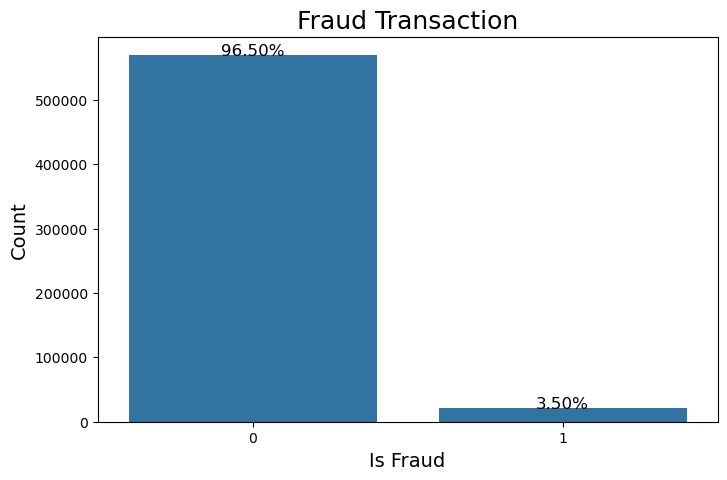

In [11]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.countplot(x='isFraud', data=train_transaction, ax=ax)
ax.set_title('Fraud Transaction', fontsize=18)
ax.set_xlabel('Is Fraud', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height,
            f'{height/train.shape[0] * 100:.2f}%',
            ha='center', fontsize=12)

##### * Only 3.5% for transactions are fraud
##### * Very imbalanced

### Detection of Missing Values
- The datasets have a big proportion of missing values.
- Train and test sets have similar percentage of features with missing values in different percentages.
- There are 1 features, which is V107, in test set with only one unique value. We will take a closer look of V107 in both train and test datasets and decide whether to remove it as only one unique value might represent it doesn't contain any useful information.

In [12]:
def detectmissing(df):
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing(%)'] = df.isnull().sum().values / train.shape[0]*100
    summary['Uniques'] = df.nunique().values

    return summary

In [13]:
train_missing = detectmissing(train)
train_missing

,Name,dtypes,Missing(%),Uniques
0,TransactionID,int64,0.000000,590540
1,isFraud,int64,0.000000,2
2,TransactionDT,int64,0.000000,573349
3,TransactionAmt,float64,0.000000,20902
4,ProductCD,object,0.000000,5
5,card1,int64,0.000000,13553
6,card2,float64,1.512683,500
7,card3,float64,0.265012,114
8,card4,object,0.267044,4
9,card5,float64,0.721204,119


In [14]:
#print("Missing value in the train set:")
#for i in [0, 10, 20, 40, 70, 80, 90, 99]:
 #   print("%0.2f percent of features have more than " % ((len(_[_ > i])/ train.shape[1])*100) + str(i) + "% of missing value")
#print('-'*70)
#print("Missing value in the test set:")
#for i in [0, 10, 20, 40, 70, 80, 90, 99]:
 #   print("%0.2f percent of features have more than " % ((len(_[_ > i])/ test.shape[1])*100) + str(i) + "% of missing value")

In [15]:
one_unique_col = [i for i in train.columns if train[i].nunique() == 1]
one_unique_col_test = [i for i in test.columns if test[i].nunique() == 1]
print("There are %d features in train set with only one unique value" % len(one_unique_col))
print("There are %d features in test set with only one unique value" % len(one_unique_col_test))
print("The feature is %s" % one_unique_col_test[0])

There are 0 features in train set with only one unique value
There are 1 features in test set with only one unique value
The feature is V107


In [16]:
train.drop(columns='V107',inplace=True)
test.drop(columns='V107',inplace=True)

### TransactionDT - timedelta from a given reference datetime
- We can have a reasonable inference that TransactionDT is in seconds by doing some trails with simple math
- Therefore, we can create new columns such as hour, day, week, month to take a closer look to the time and target
- As we can see from the distribution of TransactionDT(bin in minute), train and test datasets are in different time periods, thus splitting data by the time order can be a reasonable practice.
- It seems that in the hours from 4am to 12pm the fraction of fraudulent transaction is significantly higher than other hours. And from hour 2pm to 4pm, the fractions of fraud is the lowest. While from 7am to 10am the fraction is the highest. So we can create another new feature, classifying time periods into different levels of warning sign in terms of their fraud fraction.
- We can't model year or month as we only have one year of data so we won't be able to learn any trends. There is a chance for day of the week and hour being useful.

In [17]:
train_span = (train['TransactionDT'].max() - train['TransactionDT'].min())/(3600*24)
test_span = (test['TransactionDT'].max() - test['TransactionDT'].min())/(3600*24)
total_span = (test['TransactionDT'].max() - train['TransactionDT'].min())/(3600*24)
gap_span = (test['TransactionDT'].min() - train['TransactionDT'].max())/(3600*24)
print('Time span of Train dataset is {:.2f} days'.format(train_span))
print('Time span of Test dataset is {:.2f} days'.format(test_span))
print('Time span of Total dataset is {:.2f} days'.format(total_span))
print('Time gap between train and test is {:.2f} days'.format(gap_span))

Time span of Train dataset is 182.00 days
Time span of Test dataset is 183.00 days
Time span of Total dataset is 395.00 days
Time gap between train and test is 30.00 days


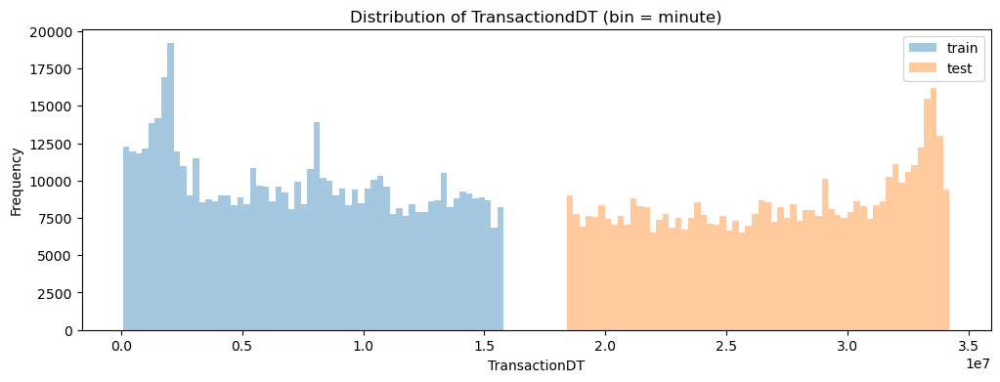

In [18]:
plt.figure(figsize=(12,4))
sns.distplot(train['TransactionDT'],kde=False,bins=60)
sns.distplot(test['TransactionDT'],kde=False,bins=60)
plt.legend(['train', 'test'])
plt.ylabel('Frequency')
plt.title('Distribution of TransactiondDT (bin = minute)');
plt.show()

As we can see from the distribution of TransactionDT(bin in minute) graph above, train and test datasets are in different time periods, thus splitting data by the time order can be a reasonable practice. And it seems that in the first month in train and last month in test, transaction frequency is higher than other months.

In [19]:
train['day'] = ((train['TransactionDT']//(3600*24)-1)%7)+1
test['day'] = ((test['TransactionDT']//(3600*24)-1)%7)+1

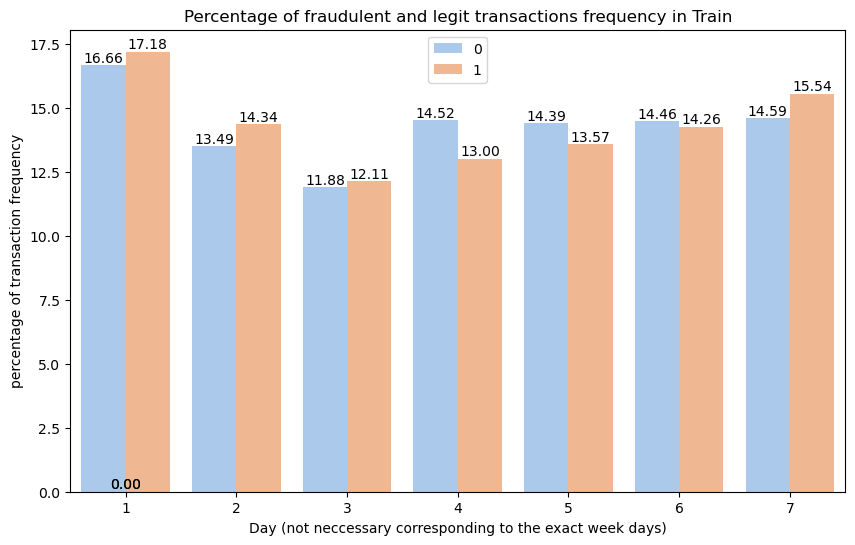

In [20]:
train_day = train.groupby('isFraud')['day'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('day')
plt.figure(figsize=(10,6))
barplot = sns.barplot(x="day", y="percentage", hue="isFraud", data=train_day, palette = 'pastel')
plt.legend()
plt.ylabel('percentage of transaction frequency')
plt.xlabel('Day (not neccessary corresponding to the exact week days)')
plt.title('Percentage of fraudulent and legit transactions frequency in Train')
for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
plt.show()

Not much finding. On average, day 1 has higher transaction frequency, both in fraud and legit transactions.

In [21]:
train['hour'] = ((train['TransactionDT']//3600)%24)+1
test['hour'] = ((test['TransactionDT']//3600)%24)+1

Text(0.5, 1.0, 'Test')

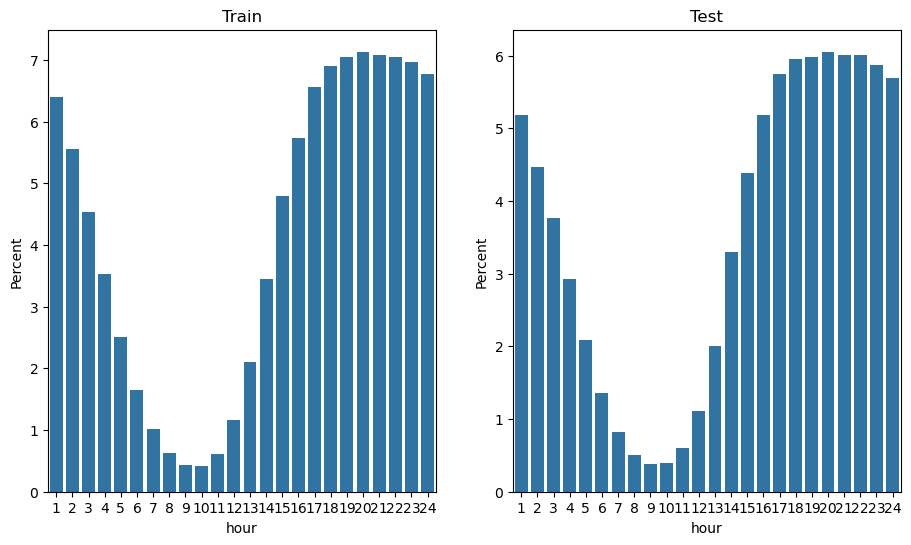

In [22]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
percentage = lambda i: len(i) / float(len(train['hour'])) * 100
ax = sns.barplot(x=train['hour'], y=train['hour'],  estimator=percentage)
ax.set(ylabel="Percent")
plt.title('Train')
plt.subplot(1,2,2)
percentage = lambda i: len(i) / float(len(train['day'])) * 100
ax = sns.barplot(x=test['hour'], y=test['hour'],  estimator=percentage)
ax.set(ylabel="Percent")
plt.title('Test')

- From hour 0-9 the amount of transaction decreases then from 9 it increases again.

In [23]:
train_hour = (train.groupby(['isFraud'])['hour']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('hour'))

<Axes: xlabel='hour', ylabel='percentage'>

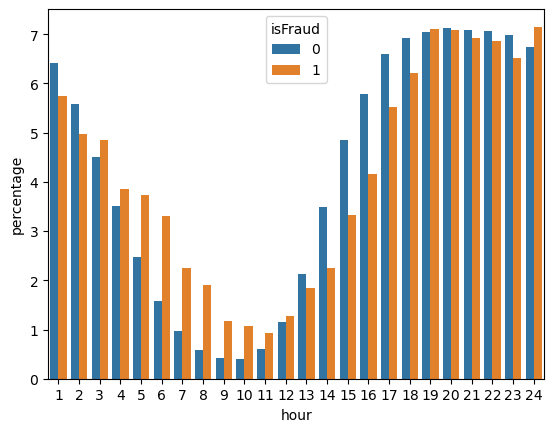

In [24]:
sns.barplot(x="hour", y="percentage", hue="isFraud", data=train_hour)

- We can see in the hour from 4 to 9 rate of fraud transaction is more.
- From 9 to 18 rate of legit transaction is more.
- With this analysis we can create a new feature.

In [25]:
def hourFeature(hour):
    if hour>3 and hour < 11:
        return "highalert"
    if hour ==11 or hour==18:
        return "lowalert"
    if hour==2 or hour==3 or hour==23:
        return "mediumalert"
    else:
        return "noalert"

In [26]:
train['alertFeature'] = train['hour'].apply(hourFeature)
test['alertFeature'] = test['hour'].apply(hourFeature)

### TransactionAmt

In [27]:
def describe(datatrain,datatest,feature):
    d = pd.DataFrame(columns=[feature,'Train','TrainFraud','TrainLegit','Test'])
    d[feature] = ['count','mean','std','min','25%','50%','75%','max','unique','NaN','NaNshare']
    for i in range(0,8):
        d['Train'].iloc[i] = datatrain[feature].describe().iloc[i]
        d['TrainFraud'].iloc[i]=datatrain[datatrain['isFraud']==1][feature].describe().iloc[i]
        d['TrainLegit'].iloc[i]=datatrain[datatrain['isFraud']==0][feature].describe().iloc[i]
        d['Test'].iloc[i]=datatest[feature].describe().iloc[i]
    d['Train'].iloc[8] = len(datatrain[feature].unique())
    d['TrainFraud'].iloc[8]=len(datatrain[datatrain['isFraud']==1][feature].unique())
    d['TrainLegit'].iloc[8]=len(datatrain[datatrain['isFraud']==0][feature].unique())
    d['Test'].iloc[8]=len(datatest[feature].unique())
    d['Train'].iloc[9] = datatrain[feature].isnull().sum()
    d['TrainFraud'].iloc[9] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()
    d['TrainLegit'].iloc[9] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()
    d['Test'].iloc[9]=datatest[feature].isnull().sum()
    d['Train'].iloc[10] = datatrain[feature].isnull().sum()/len(datatrain)
    d['TrainFraud'].iloc[10] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==1])
    d['TrainLegit'].iloc[10] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==0])
    d['Test'].iloc[10]=datatest[feature].isnull().sum()/len(datatest)
    return d

In [28]:
describe(train, test, 'TransactionAmt')

,TransactionAmt,Train,TrainFraud,TrainLegit,Test
0,count,590540.0,20663.0,569877.0,506691.0
1,mean,135.027176,149.244779,134.511665,134.725568
2,std,239.162522,232.212163,239.395078,245.779822
3,min,0.251,0.292,0.251,0.018
4,25%,43.321,35.044,43.97,40.0
5,50%,68.769,75.0,68.5,67.95
6,75%,125.0,161.0,120.0,125.0
7,max,31937.391,5191.0,31937.391,10270.0
8,unique,20902,2515,20560,14119
9,NaN,0,0,0,0


The max value of train is three times than test. It might be caused by an outlier. Let's check if there are outliers in train.

In [29]:
train[train.TransactionAmt>10000]

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,day,hour,alertFeature
274336,3261336,0,6652360,31937.391,W,16075,514.0,150.0,mastercard,102.0,credit,205.0,87.0,27.0,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,24,noalert
274339,3261339,0,6652391,31937.391,W,16075,514.0,150.0,mastercard,102.0,credit,205.0,87.0,27.0,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,24,noalert


- Only 2 values which have higher than 10,000 and these 2 values seems like duplicate.
- we can remove them to avoid overfitting.

- Since some values are high in the dataset lets take log value of this amt and create a new feature.

In [30]:
train['LogTransactionAmt'] = np.log(train['TransactionAmt'])
test['LogTransactionAmt'] = np.log(test['TransactionAmt'])

<Axes: xlabel='LogTransactionAmt', ylabel='Density'>

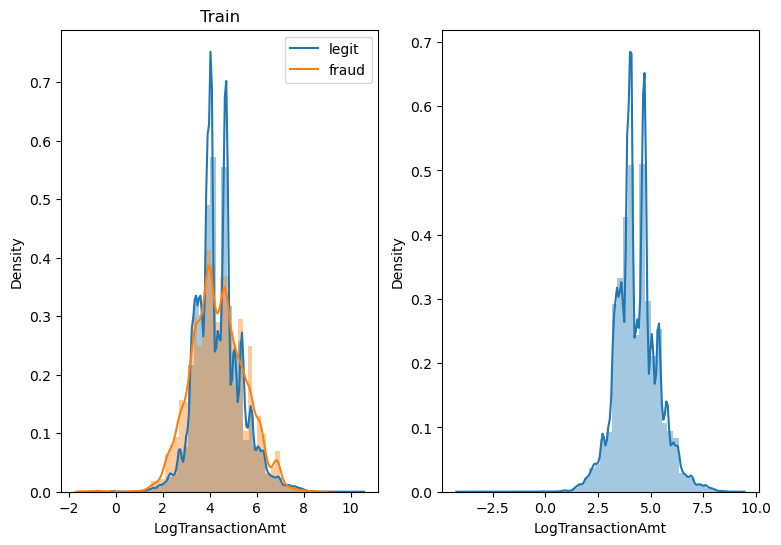

In [31]:
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['LogTransactionAmt'])
sns.distplot(train[train['isFraud']==1]['LogTransactionAmt'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['LogTransactionAmt'])

- As we can see it overlaps but logTransactionAmt after 5 and before 3 have higher frequency being fraud.
- And logTransactionAmt from 3 to 5 have higher chance it is legit transaction.

Text(0.5, 1.0, 'Test')

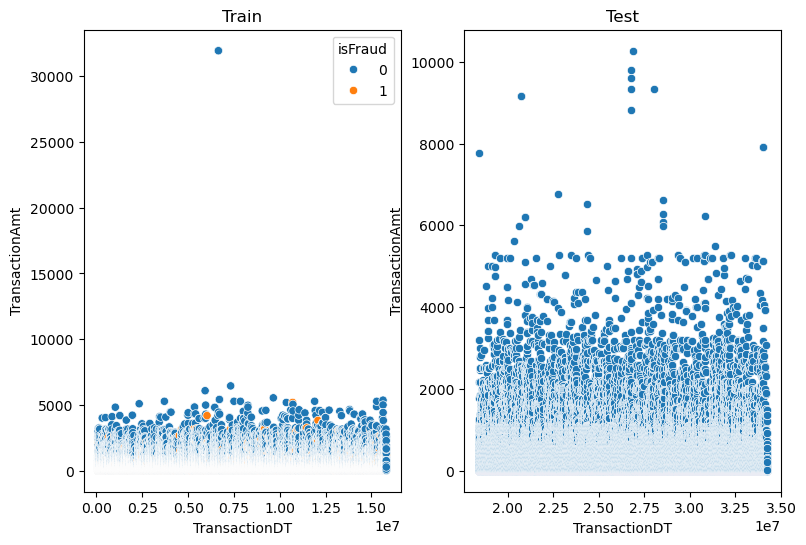

In [32]:
#lets see it overtime how it changes for both train and test
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="TransactionAmt",hue="isFraud",data=train)
plt.title('Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="TransactionAmt",data=test)
plt.title('Test')

### ProductCD

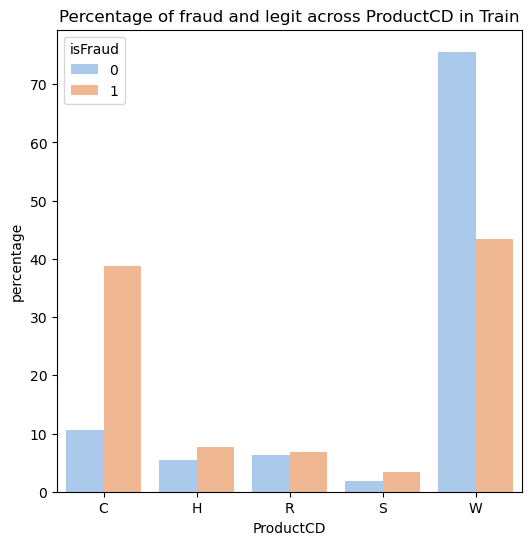

In [33]:
plt.figure(figsize=(6,6))
train_ProductCD = (train.groupby(['isFraud'])['ProductCD'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('ProductCD'))
sns.barplot(x="ProductCD", y="percentage", hue="isFraud", data=train_ProductCD,palette = 'pastel')
plt.title('Percentage of fraud and legit across ProductCD in Train')
plt.show()

From the graph above we can see that if the transaction is fraudulent, there is 40% chance it's Product C.

### card1

In [34]:
describe(train,test,'card1')

,card1,Train,TrainFraud,TrainLegit,Test
0,count,590540.0,20663.0,569877.0,506691.0
1,mean,9898.734658,9547.654164,9911.464381,9957.222175
2,std,4901.170153,4762.05138,4905.67237,4884.960969
3,min,1000.0,1015.0,1000.0,1001.0
4,25%,6019.0,5732.5,6019.0,6019.0
5,50%,9678.0,9633.0,9711.0,9803.0
6,75%,14184.0,13623.0,14229.0,14276.0
7,max,18396.0,18375.0,18396.0,18397.0
8,unique,13553,1740,13350,13244
9,NaN,0,0,0,0


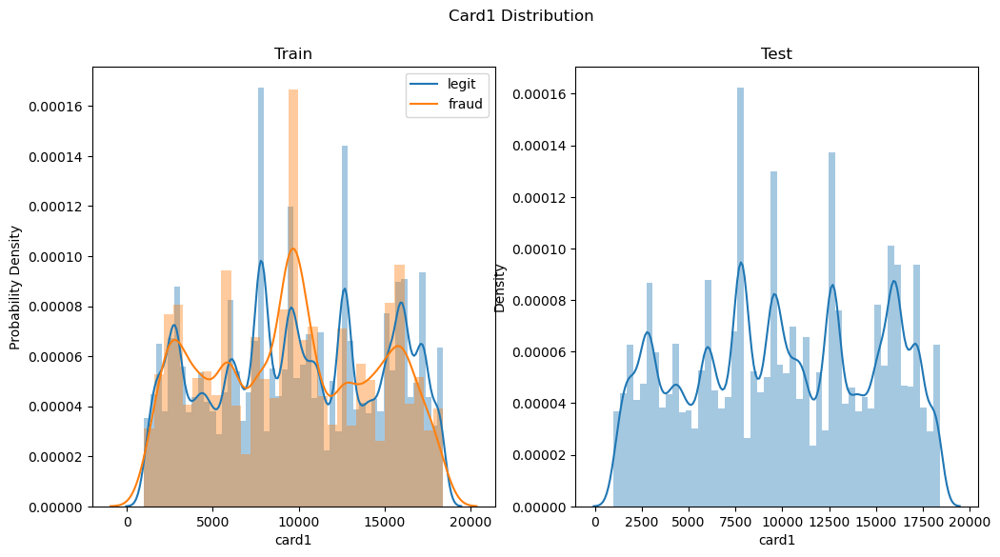

In [35]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['card1'])
sns.distplot(train[train['isFraud']==1]['card1'])
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.suptitle('Card1 Distribution' , fontsize=12)
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['card1'])
plt.title('Test')
plt.show()

### card2

In [36]:
describe(train,test,'card1')

,card1,Train,TrainFraud,TrainLegit,Test
0,count,590540.0,20663.0,569877.0,506691.0
1,mean,9898.734658,9547.654164,9911.464381,9957.222175
2,std,4901.170153,4762.05138,4905.67237,4884.960969
3,min,1000.0,1015.0,1000.0,1001.0
4,25%,6019.0,5732.5,6019.0,6019.0
5,50%,9678.0,9633.0,9711.0,9803.0
6,75%,14184.0,13623.0,14229.0,14276.0
7,max,18396.0,18375.0,18396.0,18397.0
8,unique,13553,1740,13350,13244
9,NaN,0,0,0,0


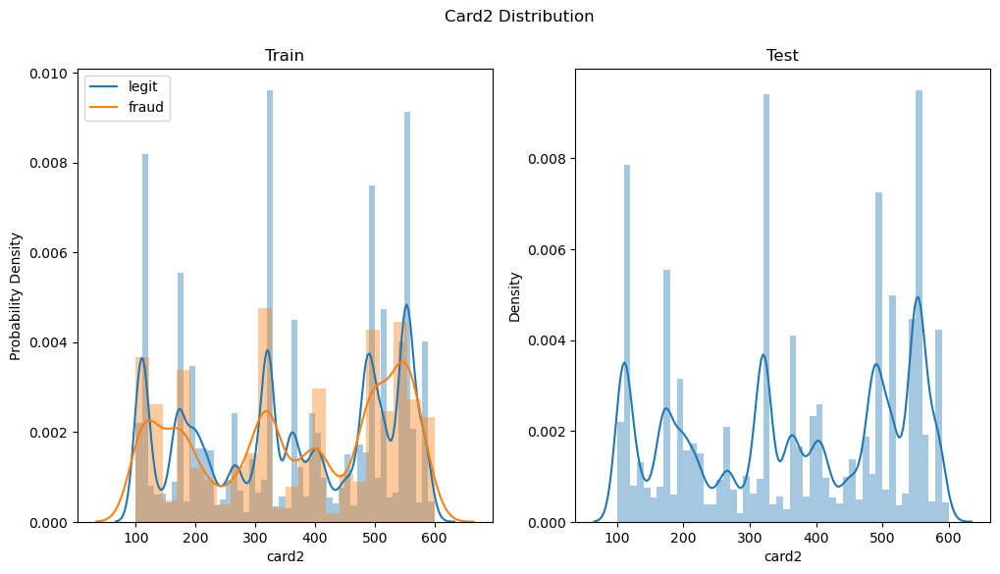

In [37]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['card2'].isnull())]['card2'])
sns.distplot(train[(train['isFraud']==1) & (~train['card2'].isnull())]['card2'])
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')
plt.suptitle('Card2 Distribution' , fontsize=12)
plt.subplot(1,2,2)
sns.distplot(test[~test['card2'].isnull()]['card2'])
plt.title('Test')
plt.show()

### card3

In [38]:
describe(train,test,'card3')

,card3,Train,TrainFraud,TrainLegit,Test
0,count,588975.0,20624.0,568351.0,503689.0
1,mean,153.194925,162.368648,152.862034,153.543409
2,std,11.336444,17.495775,10.904432,12.443013
3,min,100.0,100.0,100.0,100.0
4,25%,150.0,150.0,150.0,150.0
5,50%,150.0,150.0,150.0,150.0
6,75%,150.0,185.0,150.0,150.0
7,max,231.0,231.0,231.0,232.0
8,unique,115,63,107,116
9,NaN,1565,39,1526,3002


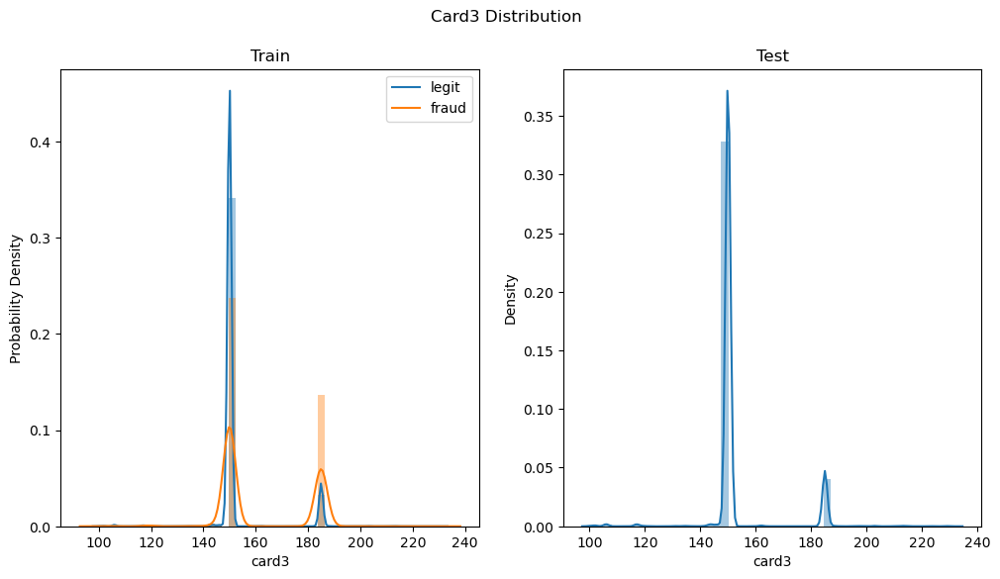

In [39]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['card3'].isnull())]['card3'])
sns.distplot(train[(train['isFraud']==1) & (~train['card3'].isnull())]['card3'])
plt.ylabel('Probability Density')
plt.legend(['legit','fraud'])
plt.title('Train')
plt.suptitle('Card3 Distribution', fontsize=12)
plt.subplot(1,2,2)
sns.distplot(test[~test['card3'].isnull()]['card3'])
plt.title('Test')
plt.show()

- It can be found that card3 contains only majority of 2 values only.
- And if the value is greater than 150 the probability of transaction being fraud increases found by the describe function.
- We can create another feature like if the value is greater than 150 marked it as T(means fraud) otherwise F.

In [40]:
def card3Values(val):
    if val==np.nan:
        return val
    else:
        if val > 150:
            return 'Positive'
        else:
            return 'Negative'

In [41]:
train['card3Values'] = train['card3'].apply(card3Values)
test['card3Values'] = test['card3'].apply(card3Values)

### card4

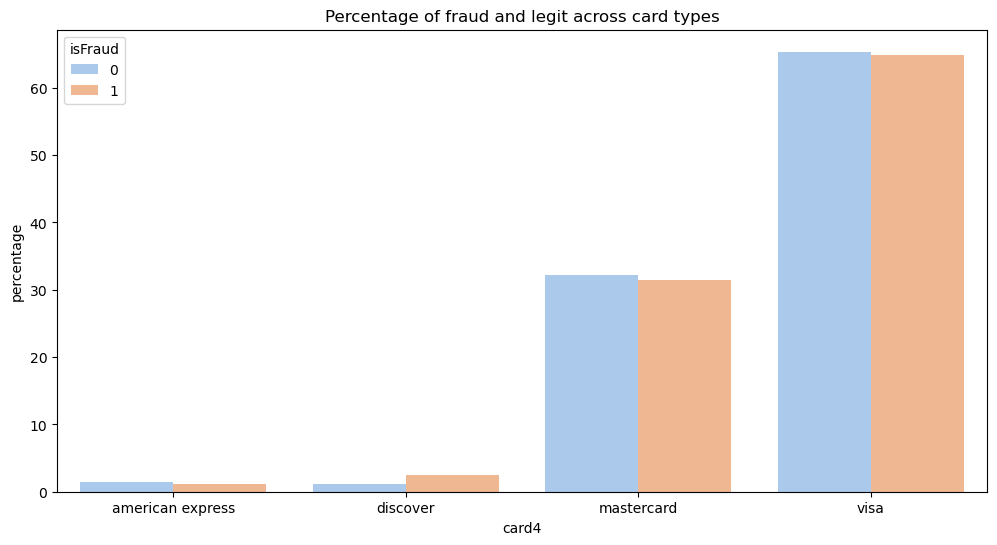

In [42]:
plt.figure(figsize=(12,6))
train_card4 = (train[~train['card4'].isnull()].groupby(['isFraud'])['card4'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card4'))
sns.barplot(x="card4", y="percentage", hue="isFraud", data=train_card4, palette = 'pastel')
plt.title('Percentage of fraud and legit across card types')
plt.show()

- Most of the transaction happend through visa card type.
- One observation is that in fraud transaction uses of card discover is more than the legit transaction.
- Otherwise other cards are relatively of same frquency.

### card5

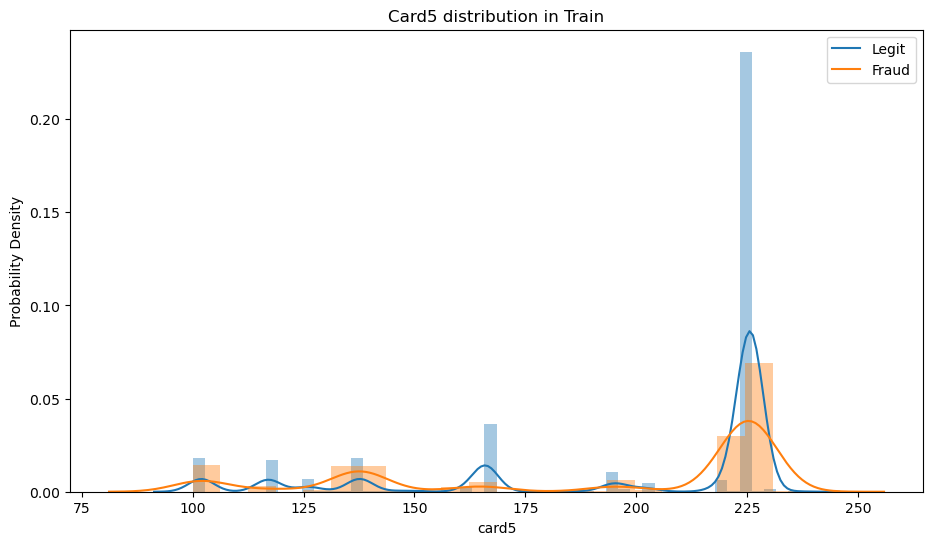

In [43]:
plt.figure(figsize=(11,6))
sns.distplot(train[(train['isFraud']==0) & (~train['card5'].isnull())]['card5'])
sns.distplot(train[(train['isFraud']==1) & (~train['card5'].isnull())]['card5'])
plt.legend(['Legit','Fraud'])
plt.ylabel('Probability Density')
plt.title('Card5 distribution in Train')
plt.show()

### card6

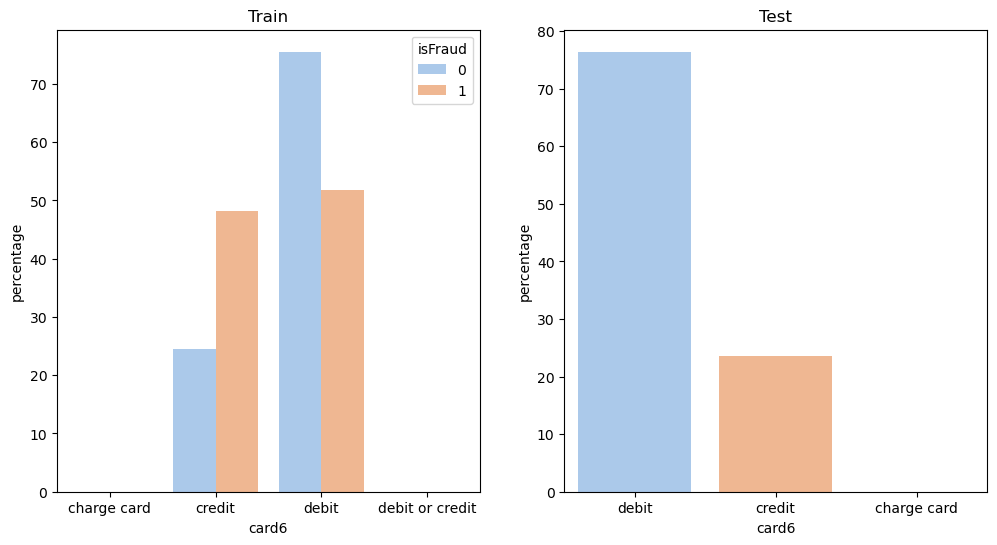

In [44]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card6'))
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6, palette = 'pastel')
plt.title('Train')
plt.subplot(1,2,2)
test_card6 = test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).reset_index()
test_card6.columns = ['card6', 'percentage']  # Ensure correct column names
sns.barplot(x="card6", y="percentage", data=test_card6, palette='pastel')
plt.xlabel('card6')
plt.title('Test')
plt.show()

In [45]:
print('%d observations are charge card' % train[train['card6']=='charge card'].shape[0])
print('%d observations are debit or credit card' % train[train['card6']=='debit or credit'].shape[0])

15 observations are charge card
30 observations are debit or credit card


There are nearly no observations in 'charge card' and 'debit or credit' and there is no 'debit or credit' in Test dataset. As the sample size is not enough for finding general pattern, and the majority card6 type is debit, we can replace these observations to 'debit' type.

- Debit or credit and charge card are almost 0% in the dataset.
- Lets combine them in to other card category.
- Credit card holders tends to have more fraud transaction then debit card holders.

In [46]:
def replacetodebit(row):
    if row==np.nan:
        return row
    if row=='debit or credit' or row=='charge card':
        return 'debit'
    else:
        return row

train['card6'] = train['card6'].apply(replacetodebit)
test['card6'] = test['card6'].apply(replacetodebit)

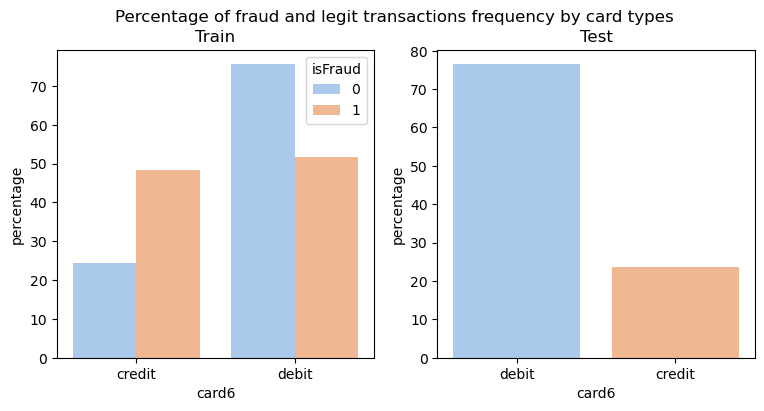

In [47]:
plt.figure(figsize=(9,4))
plt.subplot(1,2,1)
train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('card6'))
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6, palette = 'pastel')
plt.title('Train')
plt.subplot(1,2,2)
test_card6 =test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage').reset_index()
sns.barplot(x="card6", y="percentage", data=test_card6, palette = 'pastel')
plt.xlabel('card6')
plt.title('Test')
plt.suptitle('Percentage of fraud and legit transactions frequency by card types', fontsize=12)
plt.show()

### addr1 and addr2
- addr1 is the billing region(zip code)
- addr2 is the billing country
- Both the addr is for the purchaser

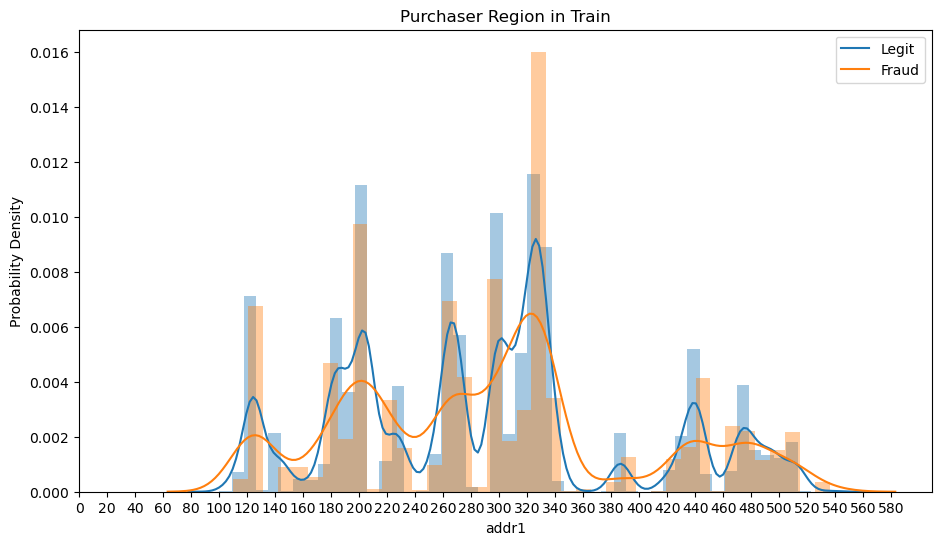

In [48]:
plt.figure(figsize=(11,6))
sns.distplot(train[(train['isFraud']==0) & (~train['addr1'].isnull())]['addr1'])
sns.distplot(train[(train['isFraud']==1) & (~train['addr1'].isnull())]['addr1'])
plt.legend(['Legit','Fraud'])
plt.xticks(np.arange(0, 600, 20))
plt.ylabel('Probability Density')
plt.title('Purchaser Region in Train')
plt.show()

330-340 seems have higher frequency of fraud

In [49]:
print('There are %d regions in addr1 of Train' % len(train['addr1'].value_counts()))
print(train['addr1'].value_counts().head(5))
print('There are %d regions in addr1 of Test' % len(test['addr1'].value_counts()))
print(test['addr1'].value_counts().head(5))

There are 332 regions in addr1 of Train
addr1
299.0    46335
325.0    42751
204.0    42020
264.0    39870
330.0    26287
Name: count, dtype: int64
There are 292 regions in addr1 of Test
addr1
299.0    38710
204.0    35049
325.0    34151
264.0    32710
330.0    22100
Name: count, dtype: int64


There are 332 and 292 regions in addr1 of Train and Test

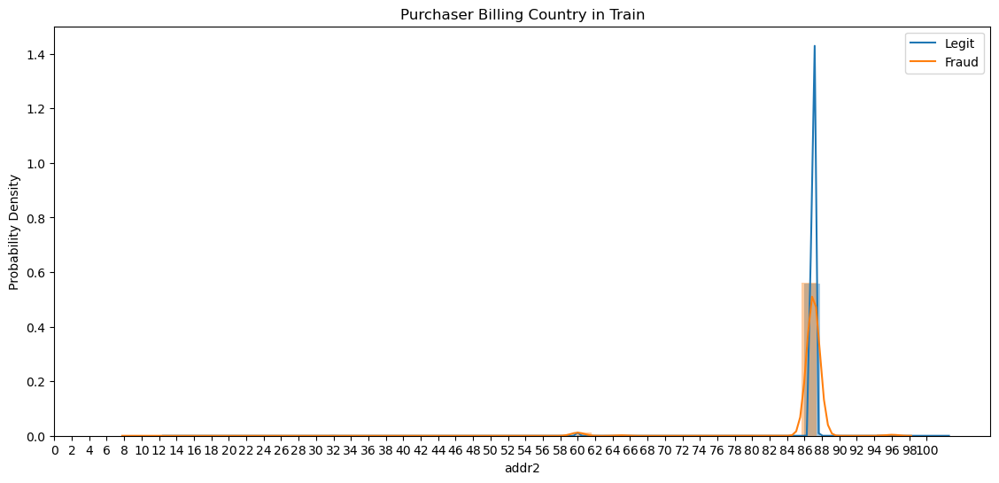

In [50]:
plt.figure(figsize=(30,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['addr2'].isnull())]['addr2'])
sns.distplot(train[(train['isFraud']==1) & (~train['addr2'].isnull())]['addr2'])
plt.legend(['Legit','Fraud'])
plt.ylabel('Probability Density')
plt.xticks(np.arange(0, 102, 2))
plt.title('Purchaser Billing Country in Train')
plt.show()

Except 87, 60, 96, the sample size of each address is not enough

In [51]:
print('There are %d billing countries in addr2 of Train. And the country 87 accounts for %.2f%%' % (len(train['addr2'].value_counts()), train['addr2'].value_counts().values[0] / len(train['addr2'])*100))
print(train['addr2'].value_counts().head(5))
print('There are %d billing countries in addr2 of Test. And the country 87 accounts for  %.2f%%' % (len(test['addr2'].value_counts()), test['addr2'].value_counts().values[0] / len(test['addr2'])*100))
print(test['addr2'].value_counts().head(5))

There are 74 billing countries in addr2 of Train. And the country 87 accounts for 88.14%
addr2
87.0    520481
60.0      3084
96.0       638
32.0        91
65.0        82
Name: count, dtype: int64
There are 72 billing countries in addr2 of Test. And the country 87 accounts for  86.04%
addr2
87.0    435934
60.0      4041
96.0       608
32.0        61
65.0        49
Name: count, dtype: int64


There are 74 billing countries in Train and 72 in test in total. The country 87 accounts for around 87% of transactions. The majority of purchaser billing country is from 87.0, which believed is the United States.

### dist1 and dist2

In [52]:
describe(train,test,'dist1')

,dist1,Train,TrainFraud,TrainLegit,Test
0,count,238269.0,4755.0,233514.0,215474.0
1,mean,118.50218,174.588854,117.360098,87.06527
2,std,371.872026,424.232313,370.641879,314.131694
3,min,0.0,0.0,0.0,0.0
4,25%,3.0,3.0,3.0,3.0
5,50%,8.0,10.0,8.0,8.0
6,75%,24.0,85.5,24.0,20.0
7,max,10286.0,4942.0,10286.0,8081.0
8,unique,2652,471,2636,1989
9,NaN,352271,15908,336363,291217


From the mean of TrainFraud it is conclude that fraud transaction have normally larger dist1 then legit transaction.

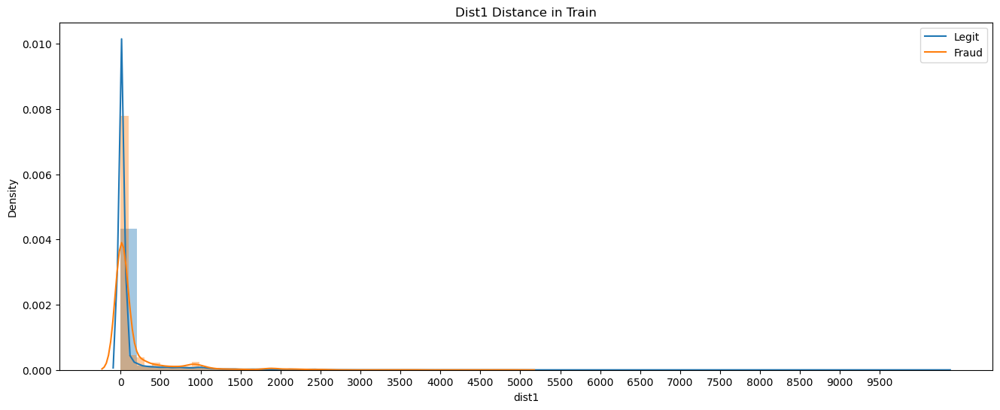

In [53]:
plt.figure(figsize=(16,6))
sns.distplot(train[(train['isFraud']==0) & (~train['dist1'].isnull())]['dist1'])
sns.distplot(train[(train['isFraud']==1) & (~train['dist1'].isnull())]['dist1'])
plt.legend(['Legit','Fraud'])
plt.xticks(np.arange(0, 10000, 500))
plt.title('Dist1 Distance in Train')
plt.show()

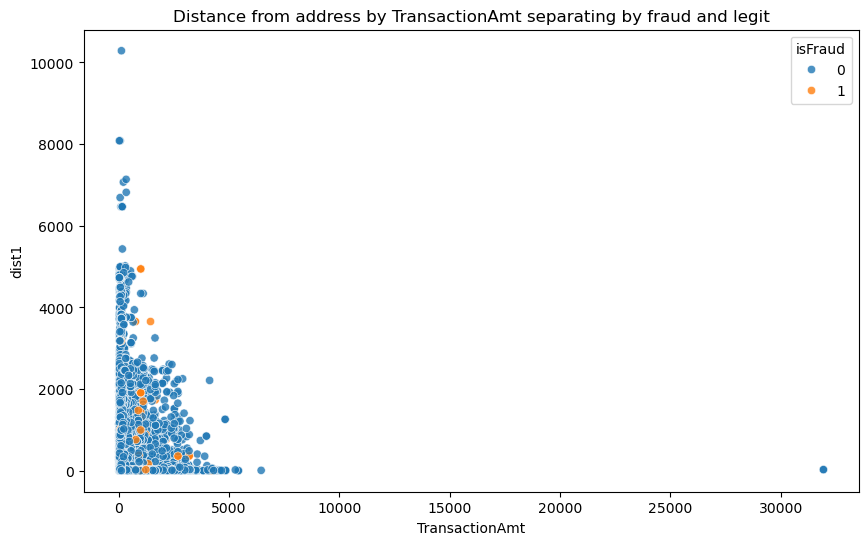

In [54]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="TransactionAmt",y="dist1",hue="isFraud",data=train[~train['dist1'].isnull()], alpha=0.8, hue_order=[0,1])
plt.title('Distance from address by TransactionAmt separating by fraud and legit')
plt.show()

It's clear that observations dist1 > 6000 are outliers in Train
so we remove them

In [55]:
train.drop(train[train.dist1>6000].index, axis=0, inplace=True)

### dist2

In [56]:
describe(train,test,'dist2')

,dist2,Train,TrainFraud,TrainLegit,Test
0,count,37627.0,3731.0,33896.0,36436.0
1,mean,231.855423,201.472259,235.199758,237.175047
2,std,529.053494,451.589576,536.798492,556.450834
3,min,0.0,0.0,0.0,0.0
4,25%,7.0,7.0,7.0,7.0
5,50%,37.0,49.0,36.0,44.0
6,75%,206.0,233.0,206.0,196.0
7,max,11623.0,9337.0,11623.0,9213.0
8,unique,1752,345,1724,1815
9,NaN,552902,16932,535970,470255


Large percentages of missing values (93%)

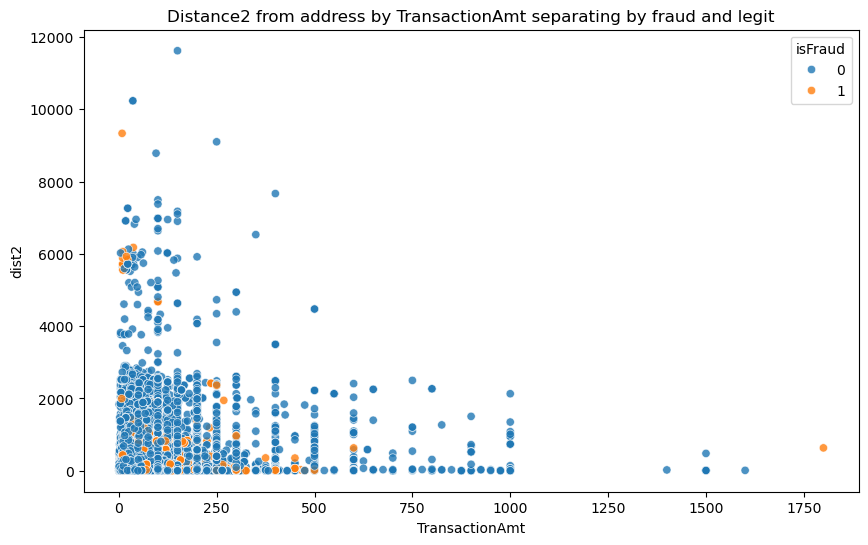

In [57]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="TransactionAmt",y="dist2",hue="isFraud",data=train[~train['dist2'].isnull()],alpha=0.8,hue_order=[0,1])
plt.title('Distance2 from address by TransactionAmt separating by fraud and legit')
plt.show()

It's clear that observations dist2 > 8000 are outliers in Train so we remove them

In [58]:
train.drop(train[train.dist2>8000].index, axis=0, inplace=True)

### P_emaildomain and R_emaildomain
purchaser and recipient email domain

In [59]:
train['R_emaildomain'].value_counts().head(10)

R_emaildomain
gmail.com        57144
hotmail.com      27509
anonymous.com    20527
yahoo.com        11841
aol.com           3701
outlook.com       2507
comcast.net       1812
yahoo.com.mx      1508
icloud.com        1398
msn.com            852
Name: count, dtype: int64

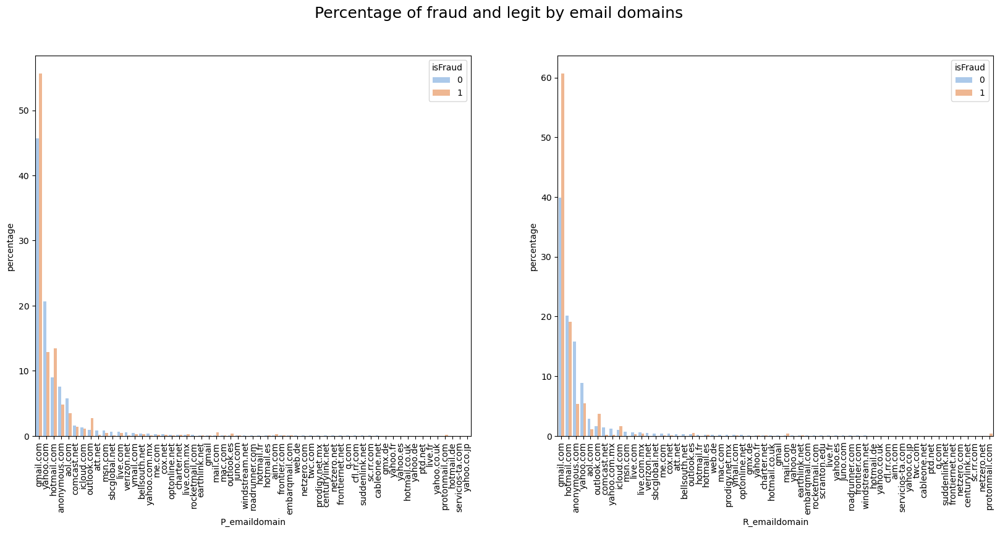

In [60]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
train_P_email = (train[~train['P_emaildomain'].isnull()].groupby(['isFraud'])['P_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index())
sns.barplot(x="P_emaildomain", y="percentage", hue="isFraud", data=train_P_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
train_R_email = train[~train['R_emaildomain'].isnull()].groupby(['isFraud'])['R_emaildomain'].value_counts(normalize=True).mul(100).rename('percentage').reset_index()
sns.barplot(x="R_emaildomain", y="percentage", hue="isFraud", data=train_R_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.suptitle('Percentage of fraud and legit by email domains', fontsize=18)
plt.show()

Let's combine group all e-mail domains by the respective enterprises and set all values with less than 500 entries as "Others".Also fill NaN by 'NoInf'.

In [61]:
train.loc[train['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
train.loc[train['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
train.loc[train['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
train.loc[train.P_emaildomain.isin(train.P_emaildomain.value_counts()[train.P_emaildomain.value_counts() <= 500 ].index), 'P_emaildomain'] = "Others"
train.P_emaildomain.fillna("NoInf", inplace=True)

train.loc[train['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

train.loc[train['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
train.loc[train['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
train.loc[train.R_emaildomain.isin(train.R_emaildomain.value_counts()[train.R_emaildomain.value_counts() <= 300 ].index), 'R_emaildomain'] = "Others"
train.R_emaildomain.fillna("NoInf", inplace=True)

In [62]:
test.loc[test['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
test.loc[test['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
test.loc[test['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
test.loc[test.P_emaildomain.isin(test.P_emaildomain.value_counts()[test.P_emaildomain.value_counts() <= 500 ].index), 'P_emaildomain'] = "Others"
test.P_emaildomain.fillna("NoInf", inplace=True)

test.loc[test['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

test.loc[test['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
test.loc[test['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
test.loc[test.R_emaildomain.isin(test.R_emaildomain.value_counts()[test.R_emaildomain.value_counts() <= 300 ].index), 'R_emaildomain'] = "Others"
test.R_emaildomain.fillna("NoInf", inplace=True)

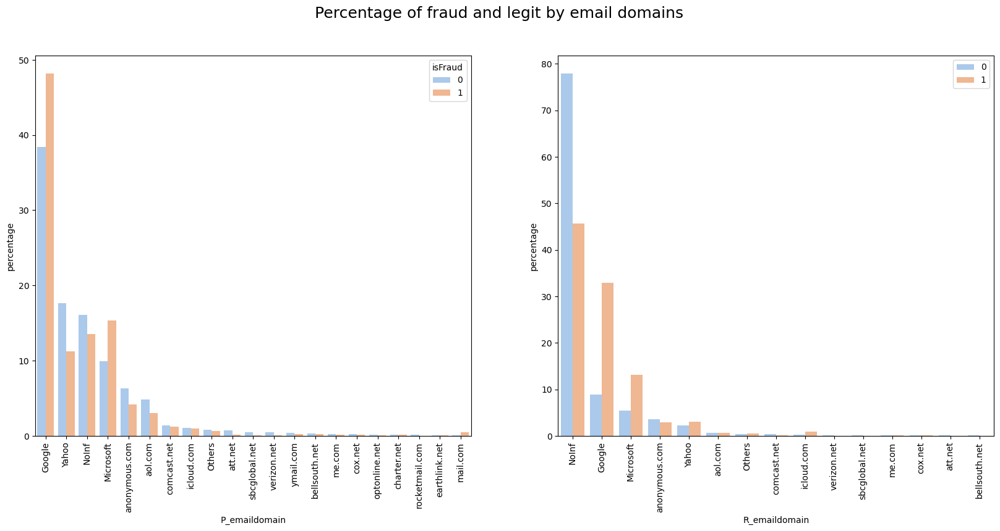

In [63]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
train_P_email = (train[~train['P_emaildomain'].isnull()].groupby(['isFraud'])['P_emaildomain'].value_counts(normalize=True).rename('percentage').mul(100).reset_index())
sns.barplot(x="P_emaildomain", y="percentage", hue="isFraud", data=train_P_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.subplot(1,2,2)
train_R_email = train[~train['R_emaildomain'].isnull()].groupby(['isFraud'])['R_emaildomain'].value_counts(normalize=True).mul(100).rename('percentage').reset_index()
sns.barplot(x="R_emaildomain", y="percentage", hue="isFraud", data=train_R_email, palette = 'pastel')
plt.xticks(rotation=90)
plt.legend(loc='upper right')
plt.suptitle('Percentage of fraud and legit by email domains', fontsize=18)
plt.show()

### C1-C14
Continuous variables.

Meaning: Counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.

C1-C14 don't have any missing value in Train but only 3 in Test, which is good.

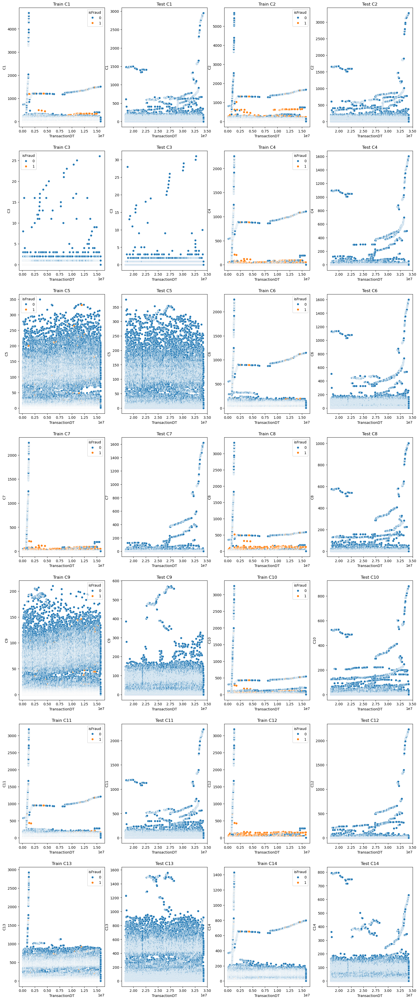

In [64]:
plt.figure(figsize=(20,50))
var = ['C' + str(i) for i in range(1,15)]
i = 1
for col in var:
    plt.subplot(7,4,i)
    sns.scatterplot(x="TransactionDT",y=col,hue="isFraud",data=train[~train[col].isnull()])
    plt.title('Train '+ col)
    i += 1
    plt.subplot(7,4,i)
    sns.scatterplot(x="TransactionDT",y=col,data=test[~test[col].isnull()])
    plt.title('Test '+ col)
    i += 1
plt.show()

- C5 and C9 don't have outliers
- Other C features have extreme outliers

In [65]:
# We remove some outliers
train.drop(train[train.C1>3000].index, axis=0, inplace=True)
train.drop(train[train.C2>3000].index, axis=0, inplace=True)
train.drop(train[train.C7>1400].index, axis=0, inplace=True)
train.drop(train[train.C4>1400].index, axis=0, inplace=True)
train.drop(train[train.C6>1400].index, axis=0, inplace=True)
train.drop(train[train.C7>1400].index, axis=0, inplace=True)
train.drop(train[train.C8>1000].index, axis=0, inplace=True)
train.drop(train[train.C10>1000].index, axis=0, inplace=True)
train.drop(train[train.C11>2000].index, axis=0, inplace=True)
train.drop(train[train.C12>2000].index, axis=0, inplace=True)
train.drop(train[train.C13>1200].index, axis=0, inplace=True)
train.drop(train[train.C14>800].index, axis=0, inplace=True)

In [66]:
var = ['C' + str(i) + '_desc' for i in range(1,15)]
col = ['C' + str(i) for i in range(1,15)]
frame = []
def des(var,col):
    for i, j in zip(var,col):
        i = describe(train,test,j)
        frame.append(i)

    return pd.concat(frame, axis=1)

des(var,col)

,C1,Train,TrainFraud,TrainLegit,Test,C2,Train,TrainFraud,TrainLegit,Test,C3,Train,TrainFraud,TrainLegit,Test,C4,Train,TrainFraud,TrainLegit,Test,C5,Train,TrainFraud,TrainLegit,Test,C6,Train,TrainFraud,TrainLegit,Test,C7,Train,TrainFraud,TrainLegit,Test,C8,Train,TrainFraud,TrainLegit,Test,C9,Train,TrainFraud,TrainLegit,Test,C10,Train,TrainFraud,TrainLegit,Test,C11,Train,TrainFraud,TrainLegit,Test,C12,Train,TrainFraud,TrainLegit,Test,C13,Train,TrainFraud,TrainLegit,Test,C14,Train,TrainFraud,TrainLegit,Test
0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,506688.0,count,589529.0,20548.0,568981.0,501943.0,count,589529.0,20548.0,568981.0,506688.0
1,mean,9.476094,20.071199,9.093465,10.093211,mean,9.811714,27.187755,9.184201,10.714635,mean,0.005654,0.000243,0.005849,0.027403,mean,1.736703,7.096506,1.543141,2.385875,mean,5.581076,1.41459,5.731543,4.962701,mean,6.724097,8.952647,6.643616,6.854992,mean,0.489123,3.973136,0.363302,1.678173,mean,1.56,9.147508,1.285987,1.893994,mean,4.487889,1.7135,4.588083,4.611943,mean,1.593691,7.146924,1.393143,1.810149,mean,6.960794,12.753942,6.751582,7.484594,mean,0.784957,7.464571,0.543732,2.649486,mean,29.370173,14.102881,29.921532,27.816035,mean,6.781995,5.189897,6.839492,6.08389
2,std,52.932277,89.351733,51.093067,79.334782,std,60.106996,116.023443,56.972868,88.896921,std,0.150664,0.015598,0.153329,0.227753,std,32.267319,54.853669,31.129529,41.942977,std,25.808046,12.981842,26.141414,25.462195,std,37.929202,56.541168,37.080265,46.783565,std,9.943471,19.788404,9.372743,37.874827,std,22.478435,42.234948,21.376557,26.766115,std,16.688161,8.47594,16.901771,21.28264,std,22.932978,39.802976,22.057859,23.692393,std,40.50403,64.627253,39.341324,61.322505,std,14.467376,32.92066,13.268654,53.97306,std,101.037613,67.126571,102.008963,101.114033,std,30.599193,39.522544,30.226171,28.315616
3,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0
4,25%,1.0,1.0,1.0,1.0,25%,1.0,1.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,1.0,1.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,1.0,1.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,1.0,1.0,1.0,1.0,25%,1.0,0.0,1.0,1.0
5,50%,1.0,2.0,1.0,1.0,50%,1.0,2.0,1.0,1.0,50%,0.0,0.0,0.0,0.0,50%,0.0,1.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,1.0,1.0,1.0,1.0,50%,0.0,0.0,0.0,0.0,50%,0.0,1.0,0.0,0.0,50%,1.0,0.0,1.0,1.0,50%,0.0,1.0,0.0,0.0,50%,1.0,2.0,1.0,1.0,50%,0.0,0.0,0.0,0.0,50%,3.0,1.0,3.0,3.0,50%,1.0,1.0,1.0,1.0
6,75%,3.0,6.0,3.0,3.0,75%,3.0,7.0,3.0,3.0,75%,0.0,0.0,0.0,0.0,75%,0.0,2.0,0.0,1.0,75%,1.0,0.0,1.0,1.0,75%,2.0,3.0,2.0,2.0,75%,0.0,1.0,0.0,0.0,75%,0.0,2.0,0.0,1.0,75%,2.0,1.0,2.0,2.0,75%,0.0,2.0,0.0,1.0,75%,2.0,4.0,2.0,2.0,75%,0.0,2.0,0.0,1.0,75%,12.0,5.0,13.0,13.0,75%,2.0,2.0,2.0,2.0
7,max,1505.0,1494.0,1505.0,2950.0,max,1670.0,1657.0,1670.0,3275.0,max,26.0,1.0,26.0,31.0,max,1107.0,1098.0,1107.0,1601.0,max,349.0,331.0,349.0,376.0,max,1147.0,1138.0,1147.0,1601.0,max,611.0,520.0,611.0,1621.0,max,886.0,758.0,886.0,1005.0,max,210.0,192.0,210.0,572.0,max,1000.0,882.0,1000.0,881.0,max,1210.0,1203.0,1210.0,2234.0,max,839.0,726.0,839.0,2234.0,max,1126.0,917.0,1126.0,1562.0,max,798.0,792.0,798.0,797.0
8,unique,988,395,918,1175,unique,958,474,824,1124,unique,27,2,27,32,unique,699,137,659,729,unique,319,124,319,354,unique,795,192,766,835,unique,365,105,337,519,unique,533,223,448,

C features don't have any missing values in Train, and there are 3 NaN consistently in Test except C13

The means and stds of TrainFraud of C features are significantly different than TrainLegit, mostly larger in TrainFraud, as what we can see from scatterplot above like C7,C8,C12.

### D1-D15
timedelta, such as days between previous transaction, etc.

In [67]:
train.iloc[:, 31:46].head()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0
1,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
2,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0
3,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0
4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [68]:
var = ['D' + str(i) + '_desc' for i in range(1,16)]
col = ['D' + str(i) for i in range(1,16)]
frame = []
def des(var,col):
    for i, j in zip(var,col):
        i = describe(train,test,j)
        frame.append(i)

    return pd.concat(frame, axis=1)

des(var,col)

,D1,Train,TrainFraud,TrainLegit,Test,D2,Train,TrainFraud,TrainLegit,Test,D3,Train,TrainFraud,TrainLegit,Test,D4,Train,TrainFraud,TrainLegit,Test,D5,Train,TrainFraud,TrainLegit,Test,D6,Train,TrainFraud,TrainLegit,Test,D7,Train,TrainFraud,TrainLegit,Test,D8,Train,TrainFraud,TrainLegit,Test,D9,Train,TrainFraud,TrainLegit,Test,D10,Train,TrainFraud,TrainLegit,Test,D11,Train,TrainFraud,TrainLegit,Test,D12,Train,TrainFraud,TrainLegit,Test,D13,Train,TrainFraud,TrainLegit,Test,D14,Train,TrainFraud,TrainLegit,Test,D15,Train,TrainFraud,TrainLegit,Test
0,count,588260.0,20502.0,567758.0,500660.0,count,309448.0,7854.0,301594.0,271922.0,count,327261.0,9570.0,317691.0,303549.0,count,420620.0,14456.0,406164.0,429840.0,count,280200.0,10797.0,269403.0,282316.0,count,72200.0,7607.0,64593.0,124783.0,count,38424.0,5707.0,32717.0,60133.0,count,74520.0,7755.0,66765.0,74338.0,count,74520.0,7755.0,66765.0,74338.0,count,514460.0,16762.0,497698.0,494146.0,count,311242.0,6106.0,305136.0,330173.0,count,63720.0,7483.0,56237.0,69254.0,count,61067.0,6734.0,54333.0,123384.0,count,61452.0,7121.0,54331.0,115194.0,count,500420.0,16272.0,484148.0,494622.0
1,mean,94.445533,38.720222,96.457799,108.207504,mean,169.639271,77.887191,172.028644,188.666621,mean,28.33649,11.732184,28.836671,33.394727,mean,140.199218,72.040883,142.625078,175.060799,mean,42.345189,13.68695,43.49374,50.977752,mean,69.989155,45.419482,72.882681,82.443145,mean,41.701463,11.255826,47.012257,61.815642,mean,146.447791,49.516994,157.706659,160.834483,mean,0.561237,0.518799,0.566166,0.553981,mean,123.994975,52.407648,126.405969,159.810552,mean,146.623248,87.314445,147.810062,218.414895,mean,53.989972,43.692503,55.360172,77.404179,mean,17.977566,6.528661,19.396536,18.225961,mean,57.941792,54.289285,58.420515,58.163186,mean,163.986597,78.378503,166.863847,206.854137
2,std,157.723147,100.838351,159.033163,176.964526,std,177.337688,128.797478,177.794114,197.099611,std,62.352791,42.00428,62.795611,82.55821,std,191.194179,140.742505,192.302053,250.41747,std,89.002047,51.930068,89.980724,116.829786,std,144.000217,101.143827,147.966363,192.867671,std,99.889685,46.743808,105.581841,150.299612,std,232.063391,133.781471,238.352786,257.003738,std,0.316676,0.333236,0.314327,0.317327,std,182.620935,127.099367,183.714943,240.566557,std,186.044721,146.561013,186.557507,253.091693,std,124.368736,98.772204,127.3255,176.218548,std,67.811679,31.480608,70.903379,78.07989,std,136.646471,126.507727,137.914013,164.015525,std,202.804666,152.163788,203.664796,269.419196
3,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,-122.0,0.0,-122.0,0.0,min,0.0,0.0,0.0,0.0,min,-83.0,0.0,-83.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,0.0,0.0,0.0,0.0,min,-53.0,0.0,-53.0,0.0,min,-83.0,0.0,-83.0,0.0,min,0.0,0.0,0.0,0.0,min,-193.0,0.0,-193.0,0.0,min,-83.0,0.0,-83.0,0.0
4,25%,0.0,0.0,0.0,0.0,25%,26.0,2.0,27.0,26.0,25%,1.0,0.0,1.0,1.0,25%,0.0,0.0,0.0,0.0,25%,1.0,0.0,1.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.958333,0.75,1.791666,1.083333,25%,0.208333,0.166666,0.208333,0.208333,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0,25%,0.0,0.0,0.0,0.0
5,50%,3.0,0.0,4.0,5.0,50%,97.0,16.0,100.0,112.0,50%,8.0,1.0,8.0,7.0,50%,26.0,1.0,28.0,21.0,50%,10.0,0.0,10.0,8.0,50%,0.0,0.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,38.041664,2.666666,50.666664,37.708332,50%,0.666666,0.625,0.666666,0.666666,50%,15.0,0.0,18.0,10.0,50%,43.0,7.0,44.0,102.0,50%,0.0,0.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,0.0,0.0,0.0,0.0,50%,52.0,1.0,57.0,48.0
6,75%,122.0,14.0,127.0,148.0,75%,276.0,95.0,281.0,305.0,75%,27.0,5.0,28.0,28.0,75%,254.0,60.0,261.0,290.0,75%,32.0,3.0,34.0,34.0,75%,40.0,22.0,44.0,13.0,75%,17.0,0.0,25.0,18.0,75%,188.583328,32.416664,207.916672,221.125,75%,0.833333,0.833333,0.833333,0.791666,75%,197.0,14.0,205.0,250.0,75%,274.0,107.75,277.0,401.0,75%,12.0,21.0,11.0,25.0,75%,0.0,0.0,0.0,0.0,75%,2.0,9.0,1.0,0.0,75%,315.0,63.0,322.0,370.0
7,max,640.0,637.0,640.0,641.0,max,640.0,6

D2,D3,D5,D6,D7,D8,D9,D11,D12,D13,D14 have at least higher than 40% NaNshare

D6-D9, D12-D13 have around 90% of missing value

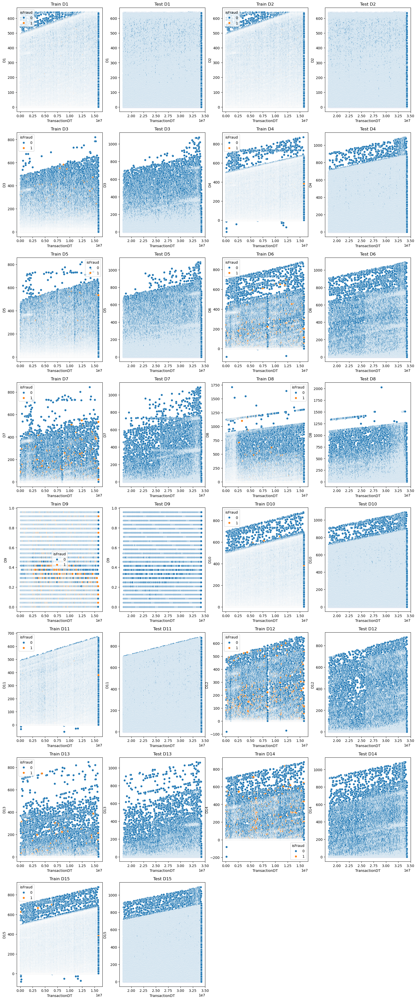

In [69]:
plt.figure(figsize=(20,50))
var = ['D' + str(i) for i in range(1,16)]
i = 1
for col in var:
    plt.subplot(8,4,i)
    sns.scatterplot(x="TransactionDT",y=col,hue="isFraud",data=train[~train[col].isnull()])
    plt.title('Train '+col)
    i += 1
    plt.subplot(8,4,i)
    sns.scatterplot(x="TransactionDT",y=col,data=test[~test[col].isnull()])
    plt.title('Test '+col)
    i += 1
plt.show()

- Most of D features are Monotonically increasing with TransactionDT which make sense
- Some of the D features in train contains -ve values.For the same feautures test does not contains -ve values.
- Since D is referring to timedelta time can never be -ve.
- So we removed all these -ve values.

### M1 - M9

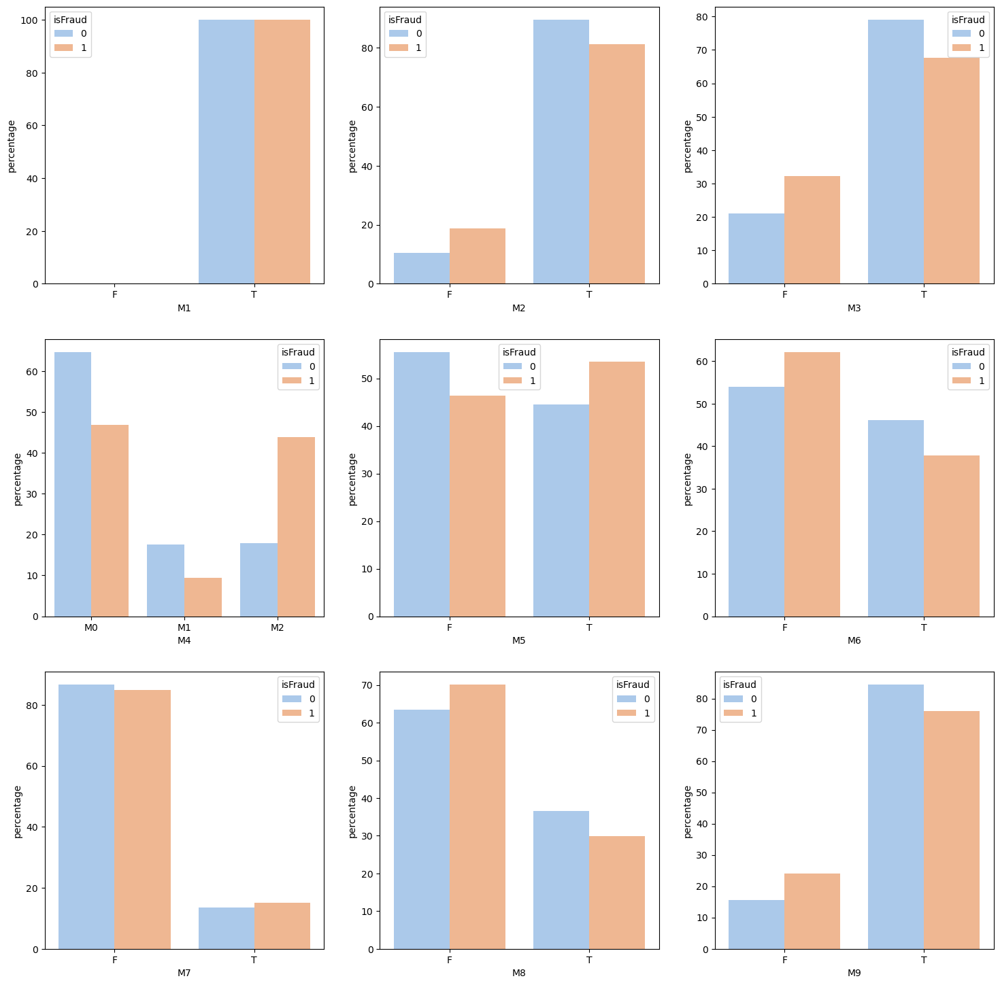

In [70]:
plt.figure(figsize=(18,18))
var = ['train_m' + str(i) for i in range(1,10)]
col = ['M' + str(i) for i in range(1,10)]
for i,j,k in zip(var,col,range(1,10)):
    i = (train.groupby(['isFraud'])[j]
                         .value_counts(normalize=True)
                         .rename('percentage')
                         .mul(100)
                         .reset_index()
                         .sort_values(j))
    plt.subplot(3,3,k)
    sns.barplot(x=j, y="percentage", hue="isFraud", data=i, palette = 'pastel')
plt.show()

- From the plot it is clear that M1 and M7 has no contribution towards finding if a transaction is fraud and legit.

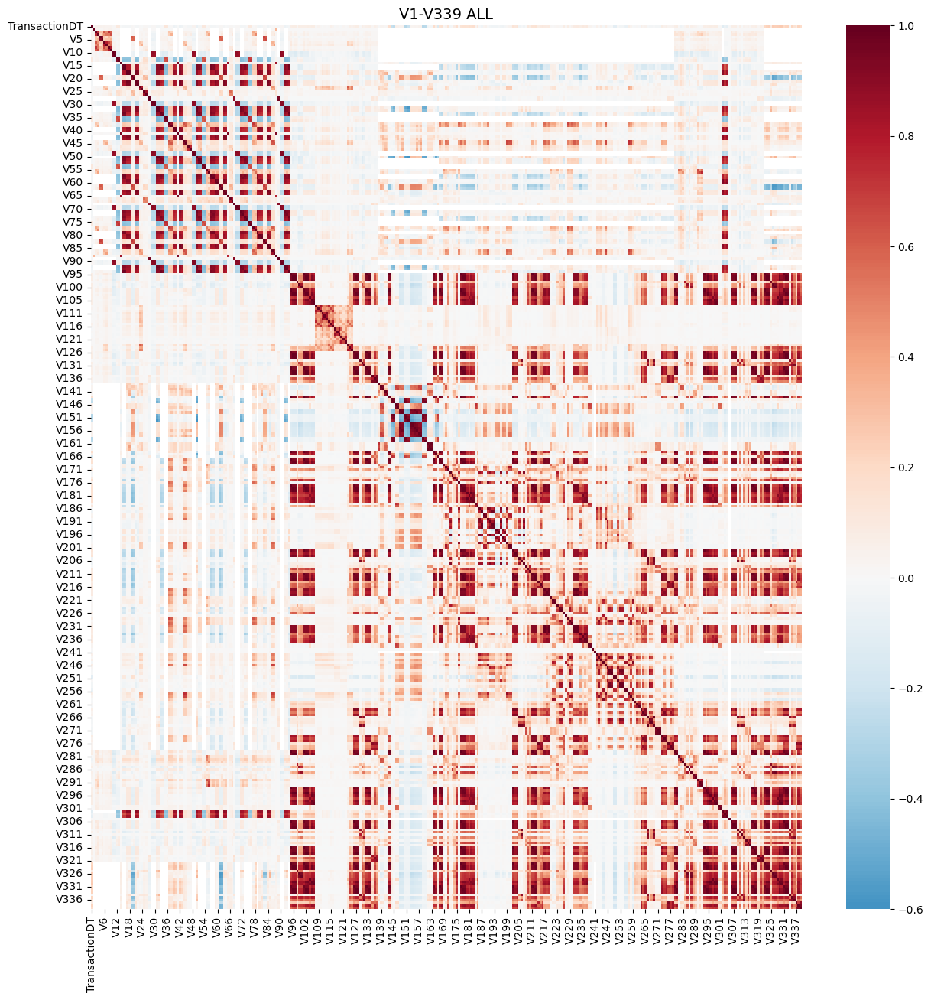

In [71]:
cols = ['TransactionDT'] + ['V'+str(x) for x in range(1,340)]
cols.remove('V107')
train2 = train[cols].sample(frac=0.2)
plt.figure(figsize=(15,15))
sns.heatmap(train2[cols].corr(), cmap='RdBu_r', annot=False, center=0.0)
plt.title('V1-V339 ALL',fontsize=14)
plt.show()

### id01 - id38

In [72]:
print(train[~train.iloc[:, 393:431].isnull().any(axis=1)].iloc[:, 393:431].shape)
train[~train.iloc[:, 393:431].isnull().any(axis=1)].iloc[:, 393:431].head()

(1328, 38)


,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
99,-10.0,129080.0,0.0,0.0,9.0,-43.0,22.0,-34.0,0.0,0.0,100.0,Found,49.0,-300.0,Found,Found,166.0,12.0,122.0,549.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,184.0,Found,Found,Found,iOS 11.0.3,mobile safari generic,32.0,1334x750,match_status:2,T,F,T,F
188,-5.0,15464.0,0.0,0.0,4.0,-44.0,6.0,-55.0,0.0,0.0,100.0,Found,55.0,-300.0,Found,Found,166.0,13.0,122.0,256.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,102.0,Found,Found,Found,Android,chrome 62.0,32.0,2560x1440,match_status:2,T,F,T,T
1702,-20.0,171610.0,0.0,0.0,13.0,-34.0,2.0,-33.0,0.0,0.0,100.0,NotFound,15.0,-300.0,Found,Found,166.0,12.0,317.0,549.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,184.0,Found,Found,Found,iOS 11.1.2,mobile safari 11.0,32.0,2208x1242,match_status:1,T,F,T,T
1706,-20.0,50100.0,0.0,0.0,12.0,-34.0,2.0,-33.0,0.0,0.0,100.0,Found,15.0,-300.0,Found,Found,166.0,12.0,317.0,549.0,252.0,14.0,IP_PROXY:TRANSPARENT,11.0,321.0,184.0,Found,Found,Found,iOS 11.1.2,mobile safari 11.0,32.0,2208x1242,match_status:1,T,F,T,T
1714,-55.0,83328.0,0.0,0.0,9.0,-100.0,17.0,-13.0,0.0,0.0,100.0,NotFound,11.0,-300.0,Found,Found,166.0,13.0,365.0,489.0,228.0,14.0,IP_PROXY:TRANSPARENT,11.0,426.0,117.0,Found,Found,Found,Windows 7,ie 11.0 for desktop,24.0,1440x900,match_status:2,T,T,T,T


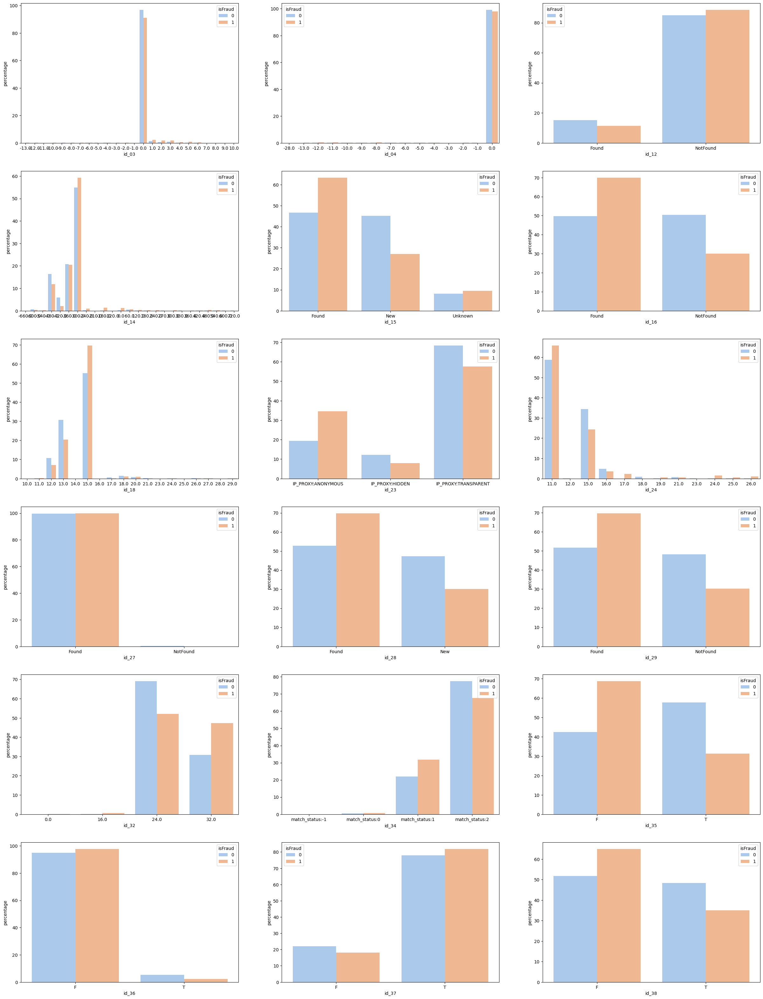

In [73]:
plt.figure(figsize=(30,40))
var = ['train_id_' + str(i) for i in range(1,19)]
col = ['id_'+str(i) for i in ['03','04',12,14,15,16,18,23,24,27,28,29,32,34,35,36,37,38]]
for i,j,k in zip(var,col,range(1,19)):
    i = (train.groupby(['isFraud'])[j]
                         .value_counts(normalize=True)
                         .rename('percentage')
                         .mul(100)
                         .reset_index()
                         .sort_values(j))
    plt.subplot(6,3,k)
    sns.barplot(x=j, y="percentage", hue="isFraud", data=i, palette = 'pastel')
plt.show()

We take a closer look to the id 30, 31, 33 as well since they are object type

In [74]:
train['id_30'].value_counts().head()

id_30
Windows 10     21154
Windows 7      13110
iOS 11.2.1      3722
iOS 11.1.2      3699
Android 7.0     2871
Name: count, dtype: int64

In [75]:
train['OS_id_30'] = train['id_30'].str.split(' ', expand=True)[0]
train['version_id_30'] = train['id_30'].str.split(' ', expand=True)[1]
test['OS_id_30'] = test['id-30'].str.split(' ', expand=True)[0]
test['version_id_30'] = test['id-30'].str.split(' ', expand=True)[1]

In [76]:
train['id_31'].value_counts().head()

id_31
chrome 63.0              21861
mobile safari 11.0       13305
mobile safari generic    11458
ie 11.0 for desktop       9016
safari generic            8180
Name: count, dtype: int64

In [77]:
train['browser_id_31'] = train['id_31'].str.split(' ', expand=True)[0].value_counts()
train['version_id_31'] = train['id_31'].str.split(' ', expand=True)[1].value_counts()
test['browser_id_31'] = test['id-31'].str.split(' ', expand=True)[0].value_counts()
test['version_id_31'] = test['id-31'].str.split(' ', expand=True)[1].value_counts()

In [78]:
train['id_33'].value_counts().head()

id_33
1920x1080    16874
1366x768      8605
1334x750      6447
2208x1242     4900
1440x900      4384
Name: count, dtype: int64

In [79]:
train['resol_width_id_31'] = train['id_33'].str.split('x', expand=True)[0].value_counts()
train['resol_height_id_31'] = train['id_33'].str.split('x', expand=True)[1].value_counts()
test['resol_width_id_31'] = test['id-33'].str.split('x', expand=True)[0].value_counts()
test['resol_height_id_31'] = test['id-33'].str.split('x', expand=True)[1].value_counts()

In [80]:
train['OS_id_30'] = train['id_30'].str.split(' ', expand=True)[0]
train['version_id_30'] = train['id_30'].str.split(' ', expand=True)[1]
test['OS_id_30'] = test['id-30'].str.split(' ', expand=True)[0]
test['version_id_30'] = test['id-30'].str.split(' ', expand=True)[1]

train['browser_id_31'] = train['id_31'].str.split(' ', expand=True)[0].value_counts()
train['version_id_31'] = train['id_31'].str.split(' ', expand=True)[1].value_counts()
test['browser_id_31'] = test['id-31'].str.split(' ', expand=True)[0].value_counts()
test['version_id_31'] = test['id-31'].str.split(' ', expand=True)[1].value_counts()

train['resol_width_id_31'] = train['id_33'].str.split('x', expand=True)[0].value_counts()
train['resol_height_id_31'] = train['id_33'].str.split('x', expand=True)[1].value_counts()
test['resol_width_id_31'] = test['id-33'].str.split('x', expand=True)[0].value_counts()
test['resol_height_id_31'] = test['id-33'].str.split('x', expand=True)[1].value_counts()

### DeviceType and DeviceInfo

In [81]:
train[~train.iloc[:, 431:433].isnull().any(axis=1)].iloc[:, 431:433].head()

,DeviceType,DeviceInfo
4,mobile,SAMSUNG SM-G892A Build/NRD90M
8,mobile,iOS Device
10,desktop,Windows
16,desktop,MacOS
17,desktop,Windows


In [82]:
print(len(train['DeviceType'].value_counts()))
print(len(train['DeviceInfo'].value_counts()))

2
1782


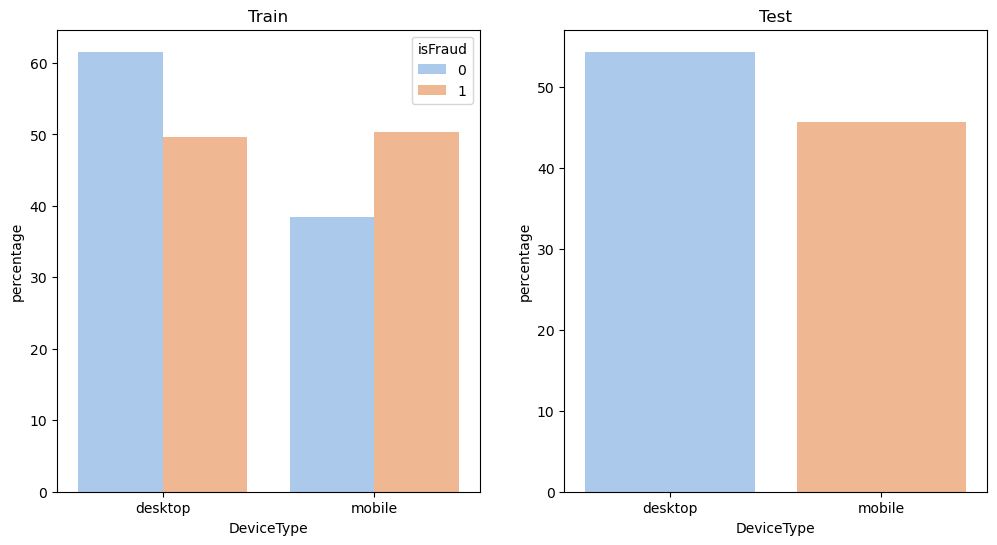

In [83]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_DeviceType = (train[~train['DeviceType'].isnull()].groupby(['isFraud'])['DeviceType'].value_counts(normalize=True).rename('percentage').mul(100).reset_index().sort_values('DeviceType'))
sns.barplot(x="DeviceType", y="percentage", hue="isFraud", data=train_DeviceType, palette = 'pastel')
plt.title('Train')
plt.subplot(1,2,2)
test_DeviceType =test[~test['DeviceType'].isnull()]['DeviceType'].value_counts(normalize=True).mul(100).rename('percentage').reset_index()
sns.barplot(x="DeviceType", y="percentage", data=test_DeviceType, palette = 'pastel')
plt.xlabel('DeviceType')
plt.title('Test')
plt.show()

Both Desktop and mobile have the same percentage of fraud.

In [84]:
train['DeviceInfo'].value_counts().head(10)

DeviceInfo
Windows                  47526
iOS Device               19781
MacOS                    12573
Trident/7.0               7428
rv:11.0                   1899
rv:57.0                    949
SM-J700M Build/MMB29K      530
SM-G610M Build/MMB29K      452
SM-G531H Build/LMY48B      402
rv:59.0                    362
Name: count, dtype: int64

## PCA

In [85]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder , minmax_scale

In [86]:
import numpy as np
import pandas as pd

def reduce_mem_usage2(df):
    """ Iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print(f"Memory usage of dataframe is {start_mem:.2f} MB")

    for col in df.columns:
        col_type = df[col].dtype

        # Skip unordered categorical columns
        if pd.api.types.is_categorical_dtype(df[col]):
            if not df[col].dtype.ordered:
                print(f"Skipping unordered categorical column: {col}")
                continue

        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()

            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print(f"Memory usage after optimization is: {end_mem:.2f} MB")
    print(f"Decreased by {100 * (start_mem - end_mem) / start_mem:.1f}%")

    return df

In [87]:
train = reduce_mem_usage2(train)
test = reduce_mem_usage2(test)

Memory usage of dataframe is 2001.50 MB
Memory usage after optimization is: 686.47 MB
Decreased by 65.7%
Memory usage of dataframe is 1712.53 MB
Memory usage after optimization is: 593.39 MB
Decreased by 65.3%


In [88]:
train.dtypes.head()

TransactionID       int32
isFraud              int8
TransactionDT       int32
TransactionAmt    float16
ProductCD          object
dtype: object

In [89]:
cat_cols = ['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9',
            'id-12', 'id-15', 'id-16', 'id-23', 'id-27', 'id-28', 'id-29','id-30', 'id-31', 'id-33', 'id-34', 'id-35', 'id-36',
            'id-37', 'id-38', 'DeviceType', 'DeviceInfo', 'hour_warning', 'new_card3', 'DeviceCorp', 'OS_id_30',
            'version_id_30', 'browser_id_31', 'version_id_31', 'resol_width_id_31', 'resol_height_id_31']
for col in cat_cols:
    if col in train.columns:
        le = LabelEncoder()
        le.fit(list(train[col].astype(str).values) + list(test[col].astype(str).values))
        train[col] = le.transform(list(train[col].astype(str).values))
        test[col] = le.transform(list(test[col].astype(str).values))

In [90]:
del train2

In [91]:
test['isFraud'] = 'test'
df = pd.concat([train, test], axis=0, sort=False)
df = df.reset_index()
df = df.drop('index', axis=1)

In [92]:
def PCA_change(df, cols, n_components, prefix='PCA_', rand_seed=4):
    pca = PCA(n_components=n_components, random_state=rand_seed)

    principalComponents = pca.fit_transform(df[cols])

    principalDf = pd.DataFrame(principalComponents)

    df.drop(cols, axis=1, inplace=True)

    principalDf.rename(columns=lambda x: str(prefix)+str(x), inplace=True)

    df = pd.concat([df, principalDf], axis=1)

    return df

In [93]:
mas_v = train.columns[55:393]

In [94]:
for col in mas_v:
    df[col] = df[col].fillna((df[col].min() - 2))
    df[col] = (minmax_scale(df[col], feature_range=(0,1)))

In [95]:
pca = PCA(n_components=338, random_state=4)
pca.fit(df[mas_v])

PCA(n_components=338, random_state=4)

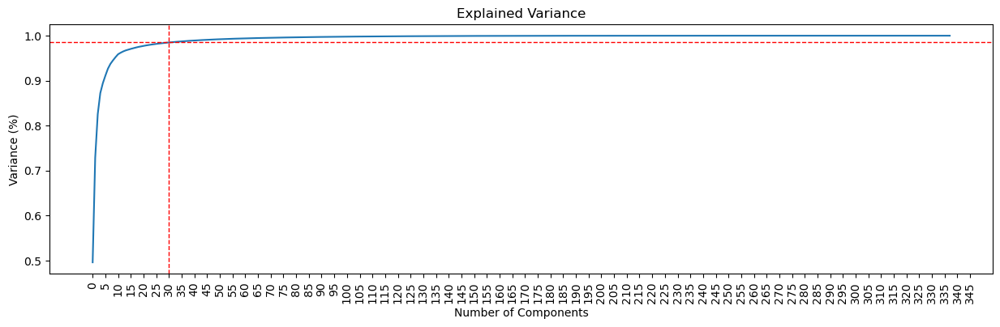

In [96]:
#Plotting the Cumulative Summation of the Explained Variance
plt.figure(figsize=(15,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.axvline(x=30, c="r", ls="--", lw=1)
plt.axhline(y=0.986, c="r", ls="--", lw=1)
plt.xticks(np.arange(0, 350, 5), rotation=90)
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.show()

30 of components can explain around 98.6% of variance. We set the n_components as 30.

In [97]:
df = PCA_change(df, mas_v, prefix='PCA_V_', n_components=30)

In [98]:
df = reduce_mem_usage2(df)

Memory usage of dataframe is 685.81 MB
Memory usage after optimization is: 555.13 MB
Decreased by 19.1%


In [99]:
train, test = df[df['isFraud'] != 'test'], df[df['isFraud'] == 'test'].drop('isFraud', axis=1)

In [100]:
X = train.sort_values('TransactionDT').drop(['isFraud', 'TransactionDT','TransactionID'], axis=1)
y = train.sort_values('TransactionDT')['isFraud'].astype(bool)

test = test.sort_values('TransactionDT').drop(['TransactionDT','TransactionID'], axis=1)

In [101]:
print('train shape: %d, %d' %(train.shape[0],train.shape[1]))
print('test shape: %d, %d' %(test.shape[0],test.shape[1]))
print('X shape: %d, %d' %(X.shape[0],X.shape[1]))
print('y shape: %d, 1' %(y.shape[0]))

train shape: 589529, 174
test shape: 506691, 171
X shape: 589529, 171
y shape: 589529, 1


In [102]:
X_ = X.copy()
test_ = test.copy()

In [103]:
def fillna(df):
    for col in df.columns:
        if pd.api.types.is_categorical_dtype(df[col]):
            df[col] = df[col].astype(str).fillna("-999")
        else:
            df[col].fillna(-999, inplace=True)

In [104]:
def clean_inf_nan(df):
    return df.replace([np.inf, -np.inf], np.nan)

# Cleaning infinite values to NaN
X = clean_inf_nan(X)
test = clean_inf_nan(test)

### Train-test Split

In [105]:
from sklearn.model_selection import train_test_split

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=45, stratify=y)

In [107]:
fillna(X_train)
fillna(X_test)

In [108]:
train.to_csv('train_for_modeling.csv', index=False)
test.to_csv('test_for_modeling.csv', index=False)

## XGBoost with feature engineering and PCA

In [ ]:
! pip install xgboost

In [110]:
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

In [115]:
# Perform One-Hot Encoding
X_train_encoded = pd.get_dummies(X_train, drop_first=True)
X_test_encoded = pd.get_dummies(X_test, drop_first=True)

# Align the columns of X_train and X_test after one-hot encoding
X_train_encoded, X_test_encoded = X_train_encoded.align(X_test_encoded, join='left', axis=1, fill_value=0)

EPOCHS = 3  # Number of folds for cross-validation
kf = StratifiedKFold(n_splits=EPOCHS, shuffle=True, random_state=42)   # Use StratifiedKFold for imbalanced data

y_test_preds = np.zeros(X_test.shape[0])  # Initialize an array to store test predictions
y_oof = np.zeros(X_train.shape[0])  # Initialize out-of-fold validation predictions

# Calculate scale_pos_weight
neg_pos_ratio = (y_train == 0).sum() / (y_train == 1).sum()  # Ratio of negative to positive samples
print(f"scale_pos_weight set to: {neg_pos_ratio:.2f}")

# Define XGBoost Classifier
clf = xgb.XGBClassifier(
    n_estimators=500,
    max_depth=9,
    learning_rate=0.05,
    subsample=0.9,
    colsample_bytree=0.9,
    random_state=42,
    scale_pos_weight=neg_pos_ratio
)

# Perform K-Fold Cross-Validation
for fold, (tr_idx, val_idx) in enumerate(kf.split(X_train_encoded, y_train), 1):
    print(f"\n{'-'*25} Fold {fold}/{EPOCHS} {'-'*25}")

    # Split data into training and validation sets for this fold
    X_tr, X_vl = X_train_encoded.iloc[tr_idx, :], X_train_encoded.iloc[val_idx, :]
    y_tr, y_vl = y_train.iloc[tr_idx], y_train.iloc[val_idx]

    # Train the model
    clf.fit(X_tr, y_tr)

    # Make predictions on validation set
    y_pred_train = clf.predict_proba(X_vl)[:, 1]  # Probabilities for class 1
    y_pred_train_labels = (y_pred_train > 0.5).astype(int)  # Convert to binary labels

    # Store out-of-fold predictions
    y_oof[val_idx] = y_pred_train

    # Evaluate using multiple metrics
    roc_auc = roc_auc_score(y_vl, y_pred_train)

    print(f"ROC AUC Score : {roc_auc:.4f}")

    # Make predictions on test data (average across folds)
    y_test_preds += clf.predict_proba(X_test_encoded)[:, 1] / EPOCHS

# Save test predictions to CSV
predictions_df = pd.DataFrame({"id": X_test.index, "prediction": y_test_preds})
predictions_df.to_csv("test_predictions.csv", index=False)

print("\nPredictions saved to 'test_predictions.csv' ")


scale_pos_weight set to: 27.69

------------------------- Fold 1/3 -------------------------
ROC AUC Score : 0.9500

------------------------- Fold 2/3 -------------------------
ROC AUC Score : 0.9450

------------------------- Fold 3/3 -------------------------
ROC AUC Score : 0.9481

Predictions saved to 'test_predictions.csv' 


## **Modeling using XGBoost on raw data**

In [116]:
df_trans = pd.read_csv('train_transaction.csv')
df_test_trans = pd.read_csv('test_transaction.csv')

df_id = pd.read_csv('train_identity.csv')
df_test_id = pd.read_csv('test_identity.csv')


df_train = df_trans.merge(df_id, how='left', left_index=True, right_index=True)
df_test = df_test_trans.merge(df_test_id, how='left', left_index=True, right_index=True)

print(df_train.shape)
print(df_test.shape)


del df_trans, df_id, df_test_trans, df_test_id

(590540, 435)
(506691, 434)


In [117]:
y_train = df_train['isFraud'].copy()

In [118]:
X_train = df_train.drop('isFraud', axis=1)
X_test = df_test.copy()

del df_train, df_test

In [119]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)

(590540, 434)
(506691, 434)
(590540,)


- I have noticed that there is a column name inconsistency in X_train and X_test dataset thus i will modify this first

In [120]:
X_test.columns = X_train.columns

In [121]:
# Label Encoding
for f in X_train.columns:
    if X_train[f].dtype=='object' or X_test[f].dtype=='object':
        lbl = preprocessing.LabelEncoder()
        lbl.fit(list(X_train[f].values) + list(X_test[f].values))
        X_train[f] = lbl.transform(list(X_train[f].values))
        X_test[f] = lbl.transform(list(X_test[f].values))

In [122]:
# Define y_test_preds as an array of zeros with the same length as X_test
y_test = np.zeros(X_test.shape[0])  # Placeholder for test predictions

In [123]:
%%time
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, average_precision_score, precision_recall_curve
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt

EPOCHS = 3  # Number of folds for cross-validation
kf = StratifiedKFold(n_splits=EPOCHS, shuffle=True, random_state=42)   # Use StratifiedKFold for imbalanced data

y_test_preds = np.zeros(X_test.shape[0])  # Initialize an array to store test predictions
y_oof = np.zeros(X_train.shape[0])  # Initialize out-of-fold validation predictions

# Calculate scale_pos_weight
neg_pos_ratio = (y_train == 0).sum() / (y_train == 1).sum()  # Ratio of negative to positive samples
print(f"scale_pos_weight set to: {neg_pos_ratio:.2f}")

# Perform K-Fold Cross-Validation
for fold, (tr_idx, val_idx) in enumerate(kf.split(X_train, y_train), 1):

    print(f"\n{'-'*25} Fold {fold}/{EPOCHS} {'-'*25}")

    # Define the XGBoost Classifier with hyperparameters
    clf = xgb.XGBClassifier(
        n_estimators=500,        # Number of boosting rounds
        max_depth=9,             # Maximum tree depth
        learning_rate=0.05,      # Step size shrinkage
        subsample=0.9,           # Fraction of samples per tree
        colsample_bytree=0.9,    # Fraction of features per tree
        random_state=42,         # Ensuring consistency
        scale_pos_weight=neg_pos_ratio  # Adjust for class imbalance
    )

    # Split data into training and validation sets for this fold
    X_tr, X_vl = X_train.iloc[tr_idx, :], X_train.iloc[val_idx, :]
    y_tr, y_vl = y_train.iloc[tr_idx], y_train.iloc[val_idx]

    # Train the model
    clf.fit(X_tr, y_tr)

    # Make predictions on validation set
    y_pred_train = clf.predict_proba(X_vl)[:, 1]  # Probabilities for class 1
    y_pred_train_labels = (y_pred_train > 0.5).astype(int)  # Convert to binary labels

    # Store out-of-fold predictions
    y_oof[val_idx] = y_pred_train

    # Evaluate using multiple metrics
    roc_auc = roc_auc_score(y_vl, y_pred_train)

    # Print results in a structured way
    print(f"ROC AUC Score : {roc_auc:.4f}")


    # Make predictions on test data (average across folds)
    y_test_preds += clf.predict_proba(X_test)[:, 1] / EPOCHS

# Save test predictions to CSV
predictions_df = pd.DataFrame({"id": X_test.index, "prediction": y_test_preds})
predictions_df.to_csv("test_predictions.csv", index=False)

print("\nPredictions saved to 'test_predictions.csv' ")

scale_pos_weight set to: 27.58

------------------------- Fold 1/3 -------------------------
ROC AUC Score : 0.9585

------------------------- Fold 2/3 -------------------------
ROC AUC Score : 0.9579

------------------------- Fold 3/3 -------------------------
ROC AUC Score : 0.9568

Predictions saved to 'test_predictions.csv' 
CPU times: total: 24min 51s
Wall time: 3min 30s


## **Tackling Class imbalance**

- Since the data is big in size, we will use function to reduce its memory for fast processing and consuming less storage.

In [124]:
# Data Loading, Understanding, and Cleaning

# Helper function
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [125]:
# loading train_transaction data
train_transaction = pd.read_csv('train_transaction.csv')
print(train_transaction.shape)
train_transaction = reduce_mem_usage(train_transaction)
train_transaction.head()

(590540, 394)
Memory usage of dataframe is 1775.15 MB
Memory usage after optimization is: 487.16 MB
Decreased by 72.6%


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,...,1.0,1.0,1.0,1.0,38.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:
# Loading train_identity data
train_identity = pd.read_csv('train_identity.csv')
print(train_identity.shape)
train_identity = reduce_mem_usage(train_identity)
train_identity.head()

(144233, 41)
Memory usage of dataframe is 45.12 MB
Memory usage after optimization is: 10.00 MB
Decreased by 77.8%


,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [127]:
# Merging transaction and identity train data
train_df = pd.merge(train_transaction, train_identity, how='left')
print(train_df.shape)
len_train_df = len(train_df)
del train_transaction, train_identity
train_df.head()

(590540, 434)


,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [128]:
# Loading test data
test_transaction = pd.read_csv('test_transaction.csv')
print(test_transaction.shape)
test_transaction = reduce_mem_usage(test_transaction)

test_identity = pd.read_csv('train_identity.csv')
print(test_identity.shape)
test_identity = reduce_mem_usage(test_identity)

test_df = pd.merge(test_transaction, test_identity, how='left')
test_df.columns = train_df.drop('isFraud', axis=1).columns
print(test_df.shape)
del test_transaction, test_identity
test_df.head()

(506691, 393)
Memory usage of dataframe is 1519.24 MB
Memory usage after optimization is: 425.24 MB
Decreased by 72.0%
(144233, 41)
Memory usage of dataframe is 45.12 MB
Memory usage after optimization is: 10.00 MB
Decreased by 77.8%
(506691, 433)


,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663549,18403224,31.953125,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.000000,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,NaN,aol.com,NaN,3.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,NaN,231.0,634.0,NaN,NaN,NaN,634.0,T,F,F,M0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.000000,W,4476,574.0,150.0,visa,226.0,debit,472.0,87.0,2636.0,NaN,hotmail.com,NaN,2.0,2.0,0.0,0.0,0.0,5.0,0.0,0.0,4.0,0.0,2.0,0.0,22.0,2.0,137.0,137.0,10.0,97.0,10.0,NaN,NaN,NaN,NaN,136.0,136.0,NaN,NaN,NaN,97.0,T,T,F,M0,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,285.000000,W,10989,360.0,150.0,visa,166.0,debit,205.0,87.0,17.0,NaN,gmail.com,NaN,5.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,7.0,4.0,42.0,42.0,41.0,242.0,41.0,NaN,NaN,NaN,NaN,242.0,242.0,NaN,NaN,NaN,242.0,T,T,T,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.937500,W,18018,452.0,150.0,mastercard,117.0,debit,264.0,87.0,6.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,2.0,5.0,0.0,0.0,5.0,0.0,6.0,0.0,14.0,6.0,22.0,22.0,0.0,22.0,0.0,NaN,NaN,NaN,NaN,22.0,22.0,NaN,NaN,NaN,22.0,T,T,T,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
# Duplicates check in train data
train_df.duplicated().sum()

0

- So, we have total 434 columns including the dependent variable as 'isFraud'. The training data consists of 5,90,540 samples and test data has 5,06,691 records. We also checked that there are no duplicate records. Let us investigate distribution of the dependent variable.

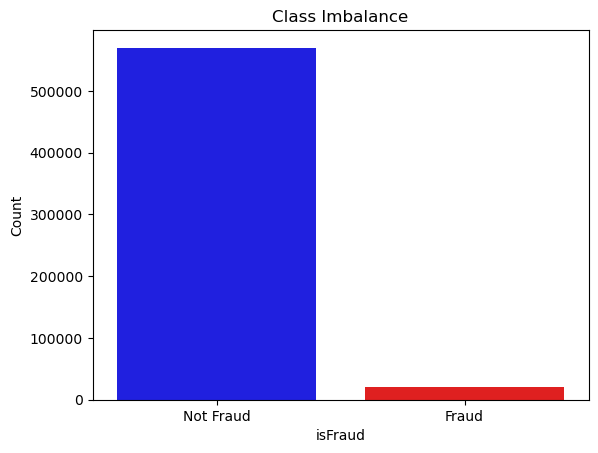

In [130]:
# Class imbalance check (Bar Chart)
sns.barplot(x=train_df.isFraud.value_counts().index, 
            y=train_df.isFraud.value_counts().values, 
            palette=['blue', 'red'])

plt.xticks(ticks=[0, 1], labels=['Not Fraud', 'Fraud'])
plt.ylabel('Count')
plt.title('Class Imbalance')
plt.show()


- As one can expect, this is a class imbalance problem. We will apply SMOTE (Synthetic Minority Over-sampling Technique) to deal with class imbalance in later steps. Let us understand the distribution of the timestamp column.

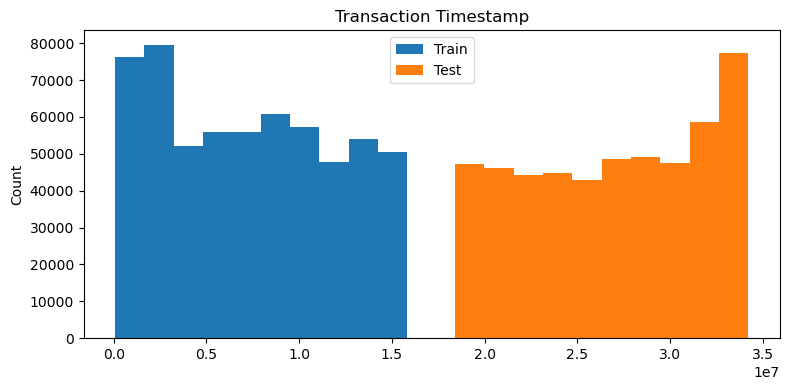

In [131]:
# Timestamp of train and test data
plt.figure(figsize=(8, 4))
plt.hist(train_df['TransactionDT'], label='Train')
plt.hist(test_df['TransactionDT'], label='Test')
plt.ylabel('Count')
plt.title('Transaction Timestamp')
plt.legend()
plt.tight_layout()
plt.show()

- We can notice that the timestamp of the test data is ahead of the timestamp of the train data. Therefore, while training machine learning model, we need to perform time-based splitting to create training and validation sets. 
- Let us deal with the missing values first.
There are considerable number of columns with high missing values. We'll use only those columns that has at least 80% data which leaves 20% to the missing values that can be fillied.

In [132]:
# Missing values check
combined_df = pd.concat([train_df.drop(columns=['isFraud', 'TransactionID']), test_df.drop(columns='TransactionID')])
print(combined_df.shape)

# Dependent variable
y = train_df['isFraud']
print(y.shape)

# Dropping columns with more than 20% missing values 
mv = combined_df.isnull().sum()/len(combined_df)
combined_mv_df = combined_df.drop(columns=mv[mv>0.2].index)
del combined_df, train_df, test_df
print(combined_mv_df.shape)

(1097231, 432)
(590540,)
(1097231, 180)


- We are left with 180 columns out of 432 after removing features with more than 20% missing values. We also have removed 'TransactionID' column as it does not hold any importance in the prediction. Let us now fill all the missing values. For numerical columns, we will use median value and for categorical column, we will use the most frequent category to fill the missing values.

In [133]:
# Filtering numerical data
num_mv_df = combined_mv_df.select_dtypes(include=np.number)
print(num_mv_df.shape)

# Filtering categorical data
cat_mv_df = combined_mv_df.select_dtypes(exclude=np.number)
print(cat_mv_df.shape)
del combined_mv_df

# Filling missing values by median for numerical columns 
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
num_df = pd.DataFrame(imp_median.fit_transform(num_mv_df), columns=num_mv_df.columns)
del num_mv_df
print(num_df.shape)

# Filling missing values by most frequent value for categorical columns
imp_max = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
cat_df = pd.DataFrame(imp_max.fit_transform(cat_mv_df), columns=cat_mv_df.columns)
del cat_mv_df
print(cat_df.shape)

# Concatinating numerical and categorical data
combined_df_cleaned = pd.concat([num_df, cat_df], axis=1)
del num_df, cat_df

# Verifying missing values
print(f'Total missing values: {combined_df_cleaned.isnull().sum().sum()}')
print(combined_df_cleaned.shape)
combined_df_cleaned.head()

(1097231, 176)
(1097231, 4)
(1097231, 176)
(1097231, 4)
Total missing values: 0
(1097231, 180)


,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D10,D15,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V53,V54,...,V135,V136,V137,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,ProductCD,card4,card6,P_emaildomain
0,86400.0,68.5,13926.0,361.0,150.0,142.0,315.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,13.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,W,discover,credit,gmail.com
1,86401.0,29.0,2755.0,404.0,150.0,102.0,325.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,W,mastercard,credit,gmail.com
2,86469.0,59.0,4663.0,490.0,150.0,166.0,330.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,315.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,W,visa,debit,outlook.com
3,86499.0,50.0,18132.0,567.0,150.0,117.0,476.0,87.0,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,84.0,111.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,0.0,10.0,0.0,4.0,0.0,0.0,1.0,1.0,1.0,1.0,38.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,W,mastercard,debit,yahoo.com
4,86506.0,50.0,4497.0,514.0,150.0,102.0,420.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,13.0,50.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,H,mastercard,credit,gmail.com


In [134]:
# Data Preprocessing

# One-hot encoding
combined_df_encoded = pd.get_dummies(combined_df_cleaned, drop_first=True)
print(combined_df_encoded.shape)
del combined_df_cleaned
combined_df_encoded.head()

(1097231, 245)


,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D10,D15,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V53,V54,...,P_emaildomain_cox.net,P_emaildomain_earthlink.net,P_emaildomain_embarqmail.com,P_emaildomain_frontier.com,P_emaildomain_frontiernet.net,P_emaildomain_gmail,P_emaildomain_gmail.com,P_emaildomain_gmx.de,P_emaildomain_hotmail.co.uk,P_emaildomain_hotmail.com,P_emaildomain_hotmail.de,P_emaildomain_hotmail.es,P_emaildomain_hotmail.fr,P_emaildomain_icloud.com,P_emaildomain_juno.com,P_emaildomain_live.com,P_emaildomain_live.com.mx,P_emaildomain_live.fr,P_emaildomain_mac.com,P_emaildomain_mail.com,P_emaildomain_me.com,P_emaildomain_msn.com,P_emaildomain_netzero.com,P_emaildomain_netzero.net,P_emaildomain_optonline.net,P_emaildomain_outlook.com,P_emaildomain_outlook.es,P_emaildomain_prodigy.net.mx,P_emaildomain_protonmail.com,P_emaildomain_ptd.net,P_emaildomain_q.com,P_emaildomain_roadrunner.com,P_emaildomain_rocketmail.com,P_emaildomain_sbcglobal.net,P_emaildomain_sc.rr.com,P_emaildomain_scranton.edu,P_emaildomain_servicios-ta.com,P_emaildomain_suddenlink.net,P_emaildomain_twc.com,P_emaildomain_verizon.net,P_emaildomain_web.de,P_emaildomain_windstream.net,P_emaildomain_yahoo.co.jp,P_emaildomain_yahoo.co.uk,P_emaildomain_yahoo.com,P_emaildomain_yahoo.com.mx,P_emaildomain_yahoo.de,P_emaildomain_yahoo.es,P_emaildomain_yahoo.fr,P_emaildomain_ymail.com
0,86400.0,68.5,13926.0,361.0,150.0,142.0,315.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,13.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,86401.0,29.0,2755.0,404.0,150.0,102.0,325.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,86469.0,59.0,4663.0,490.0,150.0,166.0,330.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,315.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,86499.0,50.0,18132.0,567.0,150.0,117.0,476.0,87.0,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,84.0,111.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False
4,86506.0,50.0,4497.0,514.0,150.0,102.0,420.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,13.0,50.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fal

In [135]:
# Separating train and test data
X = combined_df_encoded.iloc[:len_train_df]
print(X.shape)
test = combined_df_encoded.iloc[len_train_df:]
print(test.shape)
del combined_df_encoded

(590540, 245)
(506691, 245)


In [136]:
# Time-based train validation splitting with 20% data in validation set
train = pd.concat([X, y], axis=1)
train.sort_values('TransactionDT', inplace=True)
X = train.drop(['isFraud'], axis=1)
y = train['isFraud']
splitting_index = int(0.8*len(X))
X_train = X.iloc[:splitting_index].values
X_val = X.iloc[splitting_index:].values
y_train = y.iloc[:splitting_index].values
y_val = y.iloc[splitting_index:].values
test = test.values
print(X_train.shape, X_val.shape, y_train.shape, y_val.shape)
del y, train

(472432, 245) (118108, 245) (472432,) (118108,)


In [137]:
# Standardization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
test_scaled = scaler.transform(test)
del X_train, X_val, test

# Class imbalance check
pd.value_counts(y_train)

0    455833
1     16599
Name: count, dtype: int64

In [138]:
# Applying SMOTE to deal with the class imbalance by oversampling
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)
print(X_train_smote.shape, y_train_smote.shape)
del X_train_scaled, y_train
pd.value_counts(y_train_smote)

(911666, 245) (911666,)


0    455833
1    455833
Name: count, dtype: int64

- SMOTE (Synthetic Minority Over-sampling Technique) generates synthetic samples for the minority class by interpolating between existing minority class instances. It selects a sample, finds its k-nearest neighbors, and creates new points along the line connecting them to balance the dataset.

**ML modeling** 

- After hyperparameter tuning, following parameters are selected.



**Random Forest with Grid Search**

In [139]:
# Random Forest Classifier
rfc = RandomForestClassifier(criterion='entropy', max_features='sqrt', max_samples=0.5, min_samples_split=80)
rfc.fit(X_train_smote, y_train_smote)
y_predproba = rfc.predict_proba(X_val_scaled)
print(f'Validation AUC={roc_auc_score(y_val, y_predproba[:, 1])}')

Validation AUC=0.8871633707062091


**Logistic Regression**

In [140]:

# Initialize Logistic Regression with modifications
log_reg = LogisticRegression(solver='liblinear', class_weight='balanced', C=0.5, max_iter=500, random_state=42)

# Train the model
log_reg.fit(X_train_smote, y_train_smote)

# Predictions on validation set
y_predproba = log_reg.predict_proba(X_val_scaled)[:, 1]

# Evaluation
print(f'Validation AUC={roc_auc_score(y_val, y_predproba)}')


Validation AUC=0.8162823090694101


**Decision Tree Classifier**

In [141]:
# Initialize Decision Tree with modifications
dt = DecisionTreeClassifier(criterion='entropy', max_depth=10, max_features='sqrt', min_samples_split=80, random_state=42)

# Train the model
dt.fit(X_train_smote, y_train_smote)

# Predictions on validation set
y_predproba = dt.predict_proba(X_val_scaled)[:, 1]

# Evaluation
print(f'Validation AUC={roc_auc_score(y_val, y_predproba)}')


Validation AUC=0.8040762596688747


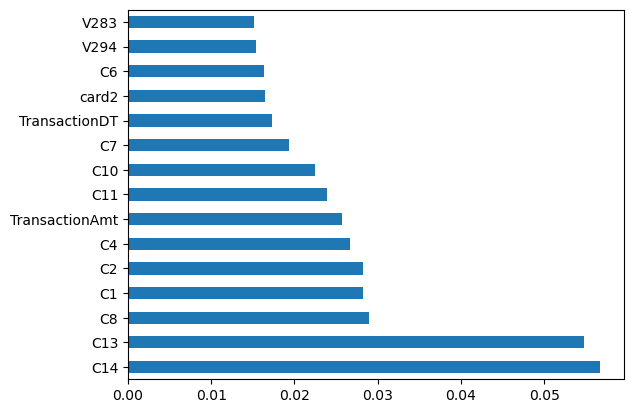

In [142]:
# Feature importances
pd.Series(rfc.feature_importances_, index=X.columns).nlargest(15).plot(kind='barh')
plt.show()